In [64]:
import numpy as np
import os
import datetime as datetime
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib notebook
import numpy as np
import pandas as pd
from datetime import timedelta


import ftplib
import os


import numpy as np
import os
import datetime as datetime
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib notebook

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import matplotlib
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 14}
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 
matplotlib.rc('font', **font)


SMALL_SIZE = 14
MEDIUM_SIZE = 14
BIGGER_SIZE = 14
matplotlib.rc('font', size=SMALL_SIZE)          # controls default text sizes
matplotlib.rc('axes', titlesize=16)     # fontsize of the axes title
matplotlib.rc('axes', labelsize=16)    # fontsize of the x and y labels
matplotlib.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
matplotlib.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
matplotlib.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
matplotlib.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
from pylab import rcParams
rcParams['figure.figsize'] = 8, 6
from sklearn import preprocessing

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import pickle
import glob

In [55]:
os.system('source /home/jackalak/heartbeat/cdf38_0-dist/bin/definitions.B')
os.environ["CDF_LIB"] = '/home/jackalak/heartbeat/cdf38_0-dist/lib'
from spacepy import pycdf
from ovationpyme.ovation_prime import FluxEstimator,AverageEnergyEstimator,BinCorrector
from ovationpyme.ovation_utilities import calc_avg_solarwind
from ovationpyme.ovation_plotting import latlt2polar,polar2dial,pcolor_flux
from nasaomnireader import omnireader







import tensorflow as tf
from tensorflow import keras
tf.keras.backend.set_floatx(
    'float32'
)

import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

import numpy as np
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
from sklearn import preprocessing


from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *




from tensorflow.keras.layers import Input

import numpy as np
import os
import datetime as datetime
import pandas as pd

# os.system('mkdir figures2')
# os.system('mkdir figures2/energyflux')
# os.system('mkdir figures2/numberflux')
# os.system('mkdir figures2/channelnumberflux')
# os.system('mkdir figures2/numberflux_from_channels')
# os.system('mkdir figures')

os.system('source /home/jackalak/heartbeat/cdf38_0-dist/bin/definitions.B')
os.environ["CDF_LIB"] = '/home/jackalak/heartbeat/cdf38_0-dist/lib'
from spacepy import pycdf
import matplotlib.pyplot as plt
from ovationpyme.ovation_prime import FluxEstimator,AverageEnergyEstimator,BinCorrector
from ovationpyme.ovation_utilities import calc_avg_solarwind
from ovationpyme.ovation_plotting import latlt2polar,polar2dial,pcolor_flux

import numpy as np
import pandas as pd
from datetime import timedelta

from nasaomnireader import omnireader

import ftplib
import os

import os
import datetime as datetime
import pickle
import glob
import tensorflow as tf
from tensorflow import keras
import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
import tensorflow.keras.backend as K


from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import matplotlib


import datetime
from os.path import isfile, join
from sys import getsizeof
from random import *

%matplotlib notebook

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.layers import Input

/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1751: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [56]:

#https://github.com/tensorflow/tensorflow/issues/956
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import InputSpec 
from tensorflow.python.keras.utils import conv_utils

class PeriodicPadding2D(layers.Layer):

  def __init__(self, padding=1, **kwargs):
    super(PeriodicPadding2D, self).__init__(**kwargs)
    self.padding = conv_utils.normalize_tuple(padding, 1, 'padding')
    self.input_spec = InputSpec(ndim=4)

  def wrap_pad(self, input, size):
    M1 = tf.concat([input[:,:, -size:], input, input[:,:, 0:size]], 2)
    M1 = tf.concat([M1[:,0:size, :], M1, M1[:,0:size, :]], 1) #not periodic
    return M1

  def compute_output_shape(self, input_shape):
    shape = list(input_shape)
    assert len(shape) == 3  
    if shape[1] is not None:
      length = shape[1] + 2*self.padding[0]
    else:
      length = None
    return tuple([shape[0], length, length])

  def call(self, inputs): 
    return self.wrap_pad(inputs, self.padding[0])

  def get_config(self):
    config = {'padding': self.padding}
    base_config = super(PeriodicPadding2D, self).get_config()
    return dict(list(base_config.items()) + list(config.items()))

def custom_loss(y_true, y_pred):
  
    loss = K.sum( K.cast(K.greater(y_true, 0),'float64')*
               K.square(y_true-y_pred) )  / ( 
                K.sum( K.cast(K.greater(y_true, 0),'float64') ))# finds the number of y_true  > 0
    return loss



def custom_mse(y_true, y_pred):
    

    
    mse = K.sum( K.cast(K.greater(y_true, 0),'float64')*(
        K.square(y_true-y_pred)) )/params['batch_size']  
    return mse

def for_CSV_val(scaler_X, model, features, test, XX_test):


    num = test.shape[0]
    

    result_val = []

    
    for i in range(0,num):


       #################################
        #
        #ML model
        ##########################
        results = model.predict( XX_test[i:i+1,:])
        flux = results[0,:,:,0]             
        pt = i

        result_val.append( 
            flux[int((90-test['SC_AACGM_LAT'][pt])/45*128),int((test['SC_AACGM_LTIME'][pt])/24*128)] )     
    
        

    return result_val


In [89]:
def plot_model_multiple(df_results_in,model_names, y_val_log_in):
    
    
    
    num = len(df_results_in)
    names = ['Validation']
    for i in range(0,num):
        names.append(model_names[i])
    y_val_log = np.log10(10**(y_val_log_in)*3.14159)

    df_results = []
    for i in range(0,num):
        df_results.append( np.log10(10**(df_results_in[i])*3.14159))
    plt.figure()
    plt.plot(y_val_log[:],alpha = 1)
    for i in range(0,num):
        plt.plot(df_results[i],alpha = 0.5)
    plt.legend(names, loc='upper left')
    plt.title('Log10 Total Energy Flux [eV/cm^s/ster/s]')
    plt.grid()
    plt.show()
    plt.savefig("1")
    

    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6,alpha = 1)
    for i in range(0,num):
        plt.plot(10**df_results[i]*1.6e-6,alpha = 0.5)
    plt.legend(names, loc='upper left')
    plt.grid()
    plt.show()
    
    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, range=(10**6*1.6e-6,8e7), log=True,alpha = 1)
    for i in range(0,num):
        plt.hist(10**df_results[i].values*1.6e-6,bins=100,range=(10**6*1.6e-6,8e7), log=True,alpha = 0.5)
    plt.legend(names, loc='upper left')
    plt.title("Total Energy Flux Histogram")
    plt.xlabel("[erg/cm^s/ster/s]")
    plt.ylabel("#/bin")
    plt.grid()
    plt.show()
    plt.savefig("2")

    plt.figure()
    plt.hist(y_val_log.values,bins=100,range=(7,13.5),alpha = 1)
    for i in range(0,num):  
        plt.hist(df_results[i].values,bins=100,range=(7,13.5),alpha = 0.5)
    plt.legend(names, loc='upper left')
    plt.title("Log10 Total Energy Flux Histogram")
    plt.xlabel("Log10 [eV/cm^s/ster/s]")
    plt.ylabel("#/bin")
    plt.grid()
    plt.show()
    plt.savefig("3")



    plt.figure()
    plt.hist(y_val_log.values,bins=100,range=(7,13.5))
    for k in range(0,num):
        plt.hist(df_results[k].values,bins=100,range=(7,13.5),alpha = 0.5)
    plt.legend(names, loc='upper left')
    plt.ylim([0,4000])
    plt.title("Log10 Total Energy Flux Histogram")
    plt.xlabel("Log10 [eV/cm^s/ster/s]")
    plt.ylabel("#/bin")
    plt.grid()
    plt.show()
    plt.savefig("4")



    plt.figure();
    for k in range(0,num):     
        errors= y_val_log.values-df_results[k].values[:,0]
        plt.scatter(y_val_log.values,errors,s=1,alpha = 0.5)
    plt.title('Errors over target Bins')
    plt.legend(model_names, loc='upper left')                      
    plt.grid()
    plt.show()

    plt.figure();
    for k in range(0,num):
        errors= y_val_log.values-df_results[k].values[:,0]     
        bin_total = np.zeros((100))
        bin_error_total = np.zeros((100))
        for j in range(0,y_val_log.values.shape[0]):
            i = int((y_val_log[j]-7)/((14-7)/100))
            if i < 100:
                bin_total[i] = bin_total[i]+1
                bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])
        avg_error_over_hist = bin_error_total/(bin_total+.00001)
        plt.scatter(np.linspace(7,13.5,num=100),avg_error_over_hist,alpha = 0.5)
    plt.title('Average Validation Error over target Bins')    
    plt.legend(model_names, loc='upper left')
    plt.ylim([0,2.6])
    plt.ylabel("Log10 [eV/cm^s/ster/s]")
    plt.xlabel("bin #")
    plt.grid()
    plt.show()
    plt.savefig("5")


    for k in range(0,num):  
        plt.figure();

        errors= y_val_log.values-df_results[k].values[:,0]
        plt.hist2d(y_val_log.values,errors,bins=100)
        plt.title('Errors over target Bins'+model_names[k])
        plt.grid()
        plt.show()
        
    plt.figure();
    for k in range(0,num):      
        errors= y_val_log.values-df_results[k].values[:,0]     
        plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1,alpha = 0.5)
    plt.legend(model_names, loc='upper left')                      
    plt.title('Errors over SC_AACGM_LAT Bins')
    plt.grid()
    plt.show()

    plt.figure();
    for k in range(0,num):
        errors= y_val_log.values-df_results[k].values[:,0]     
        bin_total = np.zeros((100))
        bin_error_total = np.zeros((100))
        for j in range(0,y_val_log.values.shape[0]):
            i = int((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/100))
            if i < 100:
                bin_total[i] = bin_total[i]+1
                bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])
        avg_error_over_hist = bin_error_total/bin_total
        plt.scatter(np.linspace(45,90,num=100),avg_error_over_hist,alpha = 0.5)
    plt.title('Average Validation Error over SC_AACGM_LAT Bins')
    plt.legend(model_names, loc='upper left')
    plt.ylim([0,1.2])
    plt.grid()
    plt.show()


In [58]:

from ovationpyme.ovation_prime import FluxEstimator,AverageEnergyEstimator,BinCorrector
from ovationpyme.ovation_utilities import calc_avg_solarwind
from ovationpyme.ovation_plotting import latlt2polar,polar2dial,pcolor_flux
    
def plot_model_multiple_polar(models,model_names, scalars, model_input_keys, dims, model_pipeline,df_val_inputs):
    for pt in range(0,df_val_inputs.shape[0]):
        dt =   df_val_inputs.index[pt]#  datetime.datetime( df_val_inputs.index[pt].date().timetuple().tm_year , df_val_inputs.index[pt].date().timetuple().tm_mon,
                                 # df_val_inputs.index[pt].date().timetuple().tm_mday, 
                                 # df_val_inputs.index[pt].date().timetuple().tm_hour, )
#                                   df_val_inputs.index[pt].date().timetuple().tm_min) #year,month,day,hour,minute)
        print(pt,df_val_inputs.index[pt])
        print(dt)      
        
        num = len(models)

        subplotlist=[]
        fig= plt.figure(figsize=(12,16))
        subplotlist.append(plt.subplot2grid((6,2), (0,0), rowspan=1,colspan=1,polar=True) )
        subplotlist.append( plt.subplot2grid((6,2), (0, 1), rowspan=1,colspan=1,polar=True) ) 
        subplotlist.append( plt.subplot2grid((6,2), (1,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (1, 1), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (2,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (2, 1), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (3,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (3, 1), rowspan=1,colspan=1,polar=True))    
        subplotlist.append( plt.subplot2grid((6,2), (4,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (4, 1), rowspan=1,colspan=1,polar=True))   
        subplotlist.append( plt.subplot2grid((6,2), (5,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (5, 1), rowspan=1,colspan=1,polar=True))
        mark= ['s', 'o', 'D', 'v']

#         %matplotlib inline
#         plt.ioff()

        pcolor_kwargs = {'cmap':'gnuplot','vmin':7.5,'vmax':13}

        for i in range(0,num):
            print(model_names[i])
            model = models[i]
            X_test=df_val_inputs[model_input_keys[i]][pt:pt+1]

            
            if (dims[i] == 2):
                
                X_test= scalars[i].transform(X_test.values)
                results = model.predict(X_test)
                mlatgridN = np.linspace(90,45,num=128)
                mltgridN =  np.linspace(0,24,num=128)   
                flux = 10**(results[0,:,:,0])*1.60218e-12*3.14159

                ax=subplotlist[i+1]
                mappableN = pcolor_flux(ax,mlatgridN,mltgridN,np.log10(flux/1.60218e-12),'N',**pcolor_kwargs)

                ax.set_title(model_names[i],fontweight="bold", fontsize='medium',pad=10)


                ax.set_theta_zero_location('S')
                theta_label_values = np.array([0.,3.,6.,9.,12.,15.,18.,21.])*180./12
                theta_labels = ['%d:00' % (int(th/180.*12)) for th in theta_label_values.flatten().tolist()]
                ax.set_thetagrids(theta_label_values,labels=theta_labels)

                r_label_values = 90.-np.array([80.,70.,60.,50.])
                r_labels = [r'$%d^{o}$' % (int(90.-rv)) for rv in r_label_values.flatten().tolist()]
                ax.set_rgrids(r_label_values,labels=r_labels)
                ax.set_rlim([0.,45.])

#                 ax.scatter(np.linspace(90,45,128),np.log10(flux[:,int(23/24*128)]/1.60218e-12), marker=mark[3])
            else:
                
                
                mlatgridN = np.linspace(90,45,num=128)
                mltgridN =  np.linspace(0,24,num=128)          

                #################################
                #
                #ML model
                ##########################
                model_input = np.zeros((128,128,len(model_input_keys[i])))
                flux = np.zeros((mlatgridN.shape[0], mltgridN.shape[0]))


                for j in range(0,mlatgridN.shape[0]):
                    for k in range(0,mltgridN.shape[0]):        
                        #calc cos and sin
                        rads = mltgridN[k]*15*3.14159/180.
                        model_input[j,k,:]=X_test.values
                        if ( (model_pipeline[i] ==1) 
                            or (len(model_input_keys[i])==33 or len(model_input_keys[i])==59)  
                           ) :
                            model_input[j,k,7]=np.cos(rads)
                            model_input[j,k,6]=np.sin(rads)
                            model_input[j,k,0]=mlatgridN[j]
                        elif  ( len(model_input_keys[i])== 72)  :
                            model_input[j,k,72-6]=np.cos(rads)
                            model_input[j,k,72-5]=np.sin(rads)
                            model_input[j,k,0]=mlatgridN[j] 
                        else: 
                            model_input[j,k,142]=np.cos(rads)
                            model_input[j,k,143]=np.sin(rads)
                            model_input[j,k,0]=mlatgridN[j]          
                shaped = np.reshape(model_input,(128*128,len(model_input_keys[i])))
                X_val_scaled = scalars[i].transform(shaped)
                #get auroral region and flux
                flux = np.log10(10**(np.reshape(model.predict(X_val_scaled),(128,128)))*3.14159)
        
                ax=subplotlist[i+1]
                mappableN = pcolor_flux(ax,mlatgridN,mltgridN,flux,'N',**pcolor_kwargs)

                ax.set_title(model_names[i],fontweight="bold", fontsize='medium',pad=10)


                ax.set_theta_zero_location('S')
                theta_label_values = np.array([0.,3.,6.,9.,12.,15.,18.,21.])*180./12
                theta_labels = ['%d:00' % (int(th/180.*12)) for th in theta_label_values.flatten().tolist()]
                ax.set_thetagrids(theta_label_values,labels=theta_labels)

                r_label_values = 90.-np.array([80.,70.,60.,50.])
                r_labels = [r'$%d^{o}$' % (int(90.-rv)) for rv in r_label_values.flatten().tolist()]
                ax.set_rgrids(r_label_values,labels=r_labels)
                ax.set_rlim([0.,45.])

#                 ax.scatter(np.linspace(90,45,128),np.log10(flux[:,int(23/24*128)]/1.60218e-12), marker=mark[3])



#         range1=np.min(np.min([-df_val['AL'].values,df_val['AE'].values,df_val['AU'].values]))
#         range2=np.max(np.max([-df_val['AL'].values,df_val['AE'].values,df_val['AU'].values]))


        ###########################3
        # Ovation128
        ########################

        auroral_types = ['diff','mono','wave','ions']
        # axS = f.add_subplot(122,projection='polar')
        for jj in range(0,3):
            atype = auroral_types[jj]
            jtype ="energy"
            bincorrect = True
            combine_hemispheres = True
            dtstr = dt.strftime('%Y%m%d %H:%M')
            if jtype=='average energy':
                estimator = AverageEnergyEstimator(atype)
                get_precip_for_time = estimator.get_eavg_for_time
            else:
                estimator = FluxEstimator(atype,jtype)
                get_precip_for_time = estimator.get_flux_for_time


            tflux_kwargs = {'combine_hemispheres':combine_hemispheres,
                            'return_dF':True}
            fluxtupleN = get_precip_for_time(dt,hemi='N',**tflux_kwargs)
            mlatgridN,mltgridN,fluxgridN,newell_coupling = fluxtupleN
            fluxtupleS = get_precip_for_time(dt,hemi='S',**tflux_kwargs)
            mlatgridS,mltgridS,fluxgridS,newell_coupling = fluxtupleS

            if bincorrect:
                bcN = BinCorrector(mlatgridN,mltgridN)
                fluxgridN = bcN.fix(fluxgridN)
                bcS = BinCorrector(mlatgridS,mltgridS)
                fluxgridS = bcS.fix(fluxgridS)
                print("Correction Applied")

            if jj== 0:
                fluxgridN_sum = fluxgridN
                fluxgridS_sum = fluxgridS
            else:
                fluxgridN_sum = fluxgridN_sum+fluxgridN
                fluxgridS_sum = fluxgridN_sum+fluxgridS

        mappableN = pcolor_flux( subplotlist[0],mlatgridN,mltgridN,np.log10(fluxgridN_sum/1.60218e-12),'N',**pcolor_kwargs)

        subplotlist[0].set_title('OVATION Pyme',pad =10,fontweight="bold", fontsize='medium')


        subplotlist[0].set_theta_zero_location('S')
        theta_label_values = np.array([0.,3.,6.,9.,12.,15.,18.,21.])*180./12
        theta_labels = ['%d:00' % (int(th/180.*12)) for th in theta_label_values.flatten().tolist()]
        subplotlist[0].set_thetagrids(theta_label_values,labels=theta_labels,fontsize='medium', )

        r_label_values = 90.-np.array([80.,70.,60.,50.])
        r_labels = [r'$%d^{o}$' % (int(90.-rv)) for rv in r_label_values.flatten().tolist()]
        subplotlist[0].set_rgrids(r_label_values,labels=r_labels)
        subplotlist[0].set_rlim([0.,45.])

#         subplotlist[0].scatter(np.ones((20))*23/24*2*3.14159 ,                   np.linspace(0,40,20)      )     

        plt.colorbar(mappableN,ax=subplotlist[i+2],label='Total Energy Flux [erg/cm^s/s]')        

        fig.tight_layout() 
#         fig.set_title('Log10 Predicted Electron Precipitation Energy Flux')
        plt.show()
    


In [65]:

    
def plot_model_multiple_polar_no_log_scale(models,model_names, scalars, model_input_keys, dims, model_pipeline,df_val_inputs):
    for pt in range(0,df_val_inputs.shape[0]):
        dt = df_val_inputs.index[pt]
        print(dt)    
        num = len(models)

        subplotlist=[]
        fig= plt.figure(figsize=(12,16))
        subplotlist.append(plt.subplot2grid((6,2), (0,0), rowspan=1,colspan=1,polar=True) )
        subplotlist.append( plt.subplot2grid((6,2), (0, 1), rowspan=1,colspan=1,polar=True) ) 
        subplotlist.append( plt.subplot2grid((6,2), (1,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (1, 1), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (2,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (2, 1), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (3,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (3, 1), rowspan=1,colspan=1,polar=True))    
        subplotlist.append( plt.subplot2grid((6,2), (4,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (4, 1), rowspan=1,colspan=1,polar=True))   
        subplotlist.append( plt.subplot2grid((6,2), (5,0), rowspan=1,colspan=1,polar=True))
        subplotlist.append( plt.subplot2grid((6,2), (5, 1), rowspan=1,colspan=1,polar=True))

        mark= ['s', 'o', 'D', 'v']

#         %matplotlib inline
#         plt.ioff()

        pcolor_kwargs = {'cmap':'gnuplot','vmin': 10**7.5*1.60218e-12,'vmax': 10**12.5*1.60218e-12}

        for i in range(0,num):
            print(model_names[i])
            model = models[i]
            X_test=df_val_inputs[model_input_keys[i]][pt:pt+1]

            
            if (dims[i] == 2):
                
                X_test= scalars[i].transform(X_test.values)
                results = model.predict(X_test)
                mlatgridN = np.linspace(90,45,num=128)
                mltgridN =  np.linspace(0,24,num=128)   
                flux = 10**(results[0,:,:,0])*1.60218e-12*3.14159

                ax=subplotlist[i+1]
                mappableN = pcolor_flux(ax,mlatgridN,mltgridN,flux,'N',**pcolor_kwargs)

                ax.set_title(model_names[i],fontweight="bold", fontsize='medium',pad=10)


                ax.set_theta_zero_location('S')
                #theta_label_values = np.array([0.,3.,6.,9.,12.,15.,18.,21.])*180./12
                #theta_labels = ['%d:00' % (int(th/180.*12)) for th in theta_label_values.flatten().tolist()]
                #ax.set_thetagrids(theta_label_values,labels=theta_labels)

                r_label_values = 90.-np.array([80.,70.,60.,50.])
                r_labels = [r'$%d^{o}$' % (int(90.-rv)) for rv in r_label_values.flatten().tolist()]
                ax.set_rgrids(r_label_values,labels=r_labels)
                ax.set_rlim([0.,45.])

#                 ax.scatter(np.linspace(90,45,128),np.log10(flux[:,int(23/24*128)]/1.60218e-12), marker=mark[3])
            else:
                
                
                mlatgridN = np.linspace(90,45,num=128)
                mltgridN =  np.linspace(0,24,num=128)          

                #################################
                #
                #ML model
                ##########################
                model_input = np.zeros((128,128,len(model_input_keys[i])))
                flux = np.zeros((mlatgridN.shape[0], mltgridN.shape[0]))


                for j in range(0,mlatgridN.shape[0]):
                    for k in range(0,mltgridN.shape[0]):        
                        #calc cos and sin
                        rads = mltgridN[k]*15*3.14159/180.
                        model_input[j,k,:]=X_test.values
                        if ( (model_pipeline[i] ==1) 
                            or (len(model_input_keys[i])==33 or len(model_input_keys[i])==59)  
                           ) :
                            model_input[j,k,7]=np.cos(rads)
                            model_input[j,k,6]=np.sin(rads)
                            model_input[j,k,0]=mlatgridN[j]
                        elif  ( len(model_input_keys[i])== 72)  :
                            model_input[j,k,72-6]=np.cos(rads)
                            model_input[j,k,72-5]=np.sin(rads)
                            model_input[j,k,0]=mlatgridN[j] 
                        else: 
                            model_input[j,k,142]=np.cos(rads)
                            model_input[j,k,143]=np.sin(rads)
                            model_input[j,k,0]=mlatgridN[j]          
                shaped = np.reshape(model_input,(128*128,len(model_input_keys[i])))
                X_val_scaled = scalars[i].transform(shaped)
                #get auroral region and flux
                flux = (10**(np.reshape(model.predict(X_val_scaled),(128,128)))*3.14159*1.60218e-12)

                ax=subplotlist[i+1]
                mappableN = pcolor_flux(ax,mlatgridN,mltgridN,flux,'N',**pcolor_kwargs)

                ax.set_title(model_names[i],fontweight="bold", fontsize='medium',pad=10)


                ax.set_theta_zero_location('S')
                #theta_label_values = np.array([0.,3.,6.,9.,12.,15.,18.,21.])*180./12
                #theta_labels = ['%d:00' % (int(th/180.*12)) for th in theta_label_values.flatten().tolist()]
                #ax.set_thetagrids(theta_label_values,labels=theta_labels)

                r_label_values = 90.-np.array([80.,70.,60.,50.])
                r_labels = [r'$%d^{o}$' % (int(90.-rv)) for rv in r_label_values.flatten().tolist()]
                ax.set_rgrids(r_label_values,labels=r_labels)
                ax.set_rlim([0.,45.])

#                 ax.scatter(np.linspace(90,45,128),np.log10(flux[:,int(23/24*128)]/1.60218e-12), marker=mark[3])



#         range1=np.min(np.min([-df_val['AL'].values,df_val['AE'].values,df_val['AU'].values]))
#         range2=np.max(np.max([-df_val['AL'].values,df_val['AE'].values,df_val['AU'].values]))


        ###########################3
        # Ovation128
        ########################

        auroral_types = ['diff','mono','wave','ions']
        # axS = f.add_subplot(122,projection='polar')
        for jj in range(0,3):
            atype = auroral_types[jj]
            jtype ="energy"
            bincorrect = True
            combine_hemispheres = True
            dtstr = dt.strftime('%Y%m%d %H:%M')
            if jtype=='average energy':
                estimator = AverageEnergyEstimator(atype)
                get_precip_for_time = estimator.get_eavg_for_time
            else:
                estimator = FluxEstimator(atype,jtype)
                get_precip_for_time = estimator.get_flux_for_time


            tflux_kwargs = {'combine_hemispheres':combine_hemispheres,
                            'return_dF':True}
            fluxtupleN = get_precip_for_time(dt,hemi='N',**tflux_kwargs)
            mlatgridN,mltgridN,fluxgridN,newell_coupling = fluxtupleN
            fluxtupleS = get_precip_for_time(dt,hemi='S',**tflux_kwargs)
            mlatgridS,mltgridS,fluxgridS,newell_coupling = fluxtupleS

            if bincorrect:
                bcN = BinCorrector(mlatgridN,mltgridN)
                fluxgridN = bcN.fix(fluxgridN)
                bcS = BinCorrector(mlatgridS,mltgridS)
                fluxgridS = bcS.fix(fluxgridS)
                print("Correction Applied")

            if jj== 0:
                fluxgridN_sum = fluxgridN
                fluxgridS_sum = fluxgridS
            else:
                fluxgridN_sum = fluxgridN_sum+fluxgridN
                fluxgridS_sum = fluxgridN_sum+fluxgridS

        mappableN = pcolor_flux( subplotlist[0],mlatgridN,mltgridN,fluxgridN_sum,'N',**pcolor_kwargs)

        subplotlist[0].set_title('OVATION Pyme',pad =10,fontweight="bold", fontsize='medium')


        subplotlist[0].set_theta_zero_location('S')
        theta_label_values = np.array([0.,3.,6.,9.,12.,15.,18.,21.])*180./12
        theta_labels = ['%d:00' % (int(th/180.*12)) for th in theta_label_values.flatten().tolist()]
        subplotlist[0].set_thetagrids(theta_label_values,labels=theta_labels,fontsize='medium', )

        r_label_values = 90.-np.array([80.,70.,60.,50.])
        r_labels = [r'$%d^{o}$' % (int(90.-rv)) for rv in r_label_values.flatten().tolist()]
        subplotlist[0].set_rgrids(r_label_values,labels=r_labels)
        subplotlist[0].set_rlim([0.,45.])

#         subplotlist[0].scatter(np.ones((20))*23/24*2*3.14159 ,                   np.linspace(0,40,20)      )     

        plt.colorbar(mappableN,ax=subplotlist[i+2],label='Total Energy Flux [erg/cm^s/s]')        

        fig.tight_layout() 
#         fig.set_title('Log10 Predicted Electron Precipitation Energy Flux')
        plt.show()

In [60]:
file_load_df_cumulative = '/media/jackalak/TOSHIBA EXT/heartbeat/ParticlePrecipitation/ML_DB_subsamp_ext_full_dfCumulative_complexHemisphereCombine.csv'
DMSP_DATA_DIR=''
df_cumulative = pd.read_csv(os.path.join(DMSP_DATA_DIR,file_load_df_cumulative))
df_cumulative = df_cumulative.sort_values(by=['ID_SC', 'Datetimes'])
df_cumulative = df_cumulative.set_index('Datetimes')
df_cumulative.index = pd.to_datetime(df_cumulative.index)
print(df_cumulative.columns.tolist())

cols_to_drop_validation = [c for c in df_cumulative.columns if ('STD' in c) | ('AVG' in c) ]
# cols_to_drop_validation = [c for c in df.columns if ('1min' in c) | ('3min' in c) | ('4min' in c) | ('5min' in c) | ('15min' in c) | ('newell' in c) | ('STD' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]

df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)

# high_mask = np.log10(df_cumulative['ELE_TOTAL_ENERGY_FLUX']) >= 7.4
# df_cumulative = df_cumulative[high_mask]

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['ID_SC'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

# mask_for_2010_to_2014 = [(df_train.index.year == 2010) | (df_train.index.year == 2011)
#                          | (df_train.index.year == 2012) |(df_train.index.year == 2013)
#                          | (df_train.index.year == 2014)]
# df_train = df_train[mask_for_2010_to_2014[0]]
df_train = df_train.sort_values(by=['ID_SC', 'Datetimes'])
df_val = df_val.sort_values(by=['ID_SC', 'Datetimes'])

# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

['SC_AACGM_LAT', 'SC_AACGM_LTIME', 'ELE_TOTAL_ENERGY_FLUX', 'ELE_TOTAL_ENERGY_FLUX_STD', 'ELE_AVG_ENERGY', 'ELE_AVG_ENERGY_STD', 'ID_SC', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'Bz', 'By', 'Bx', 'AE', 'AL', 'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr', 'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr', 'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr', 'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr', 'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'A

In [61]:
import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,11.5),'float32')*K.cast(K.less_equal(y_pred,11.5),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,12.),'float32')*K.cast(K.less_equal(y_pred,12.0),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.5),'float32')*K.cast(K.less_equal(y_pred,12.5),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.75),'float32')*K.cast(K.less_equal(y_pred,12.75),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,13.),'float32')*K.cast(K.less_equal(y_pred,13.),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

In [62]:

models = []
model_names = []
scalars = []
model_input_keys = []
dims = [1,1,1,2,2,2]
model_pipeline = [1,1,1,1,1,1]

filename = 'Scalar_X_pipeline1_148.pkl'
scaler_X = pickle.load( open(filename,"rb"))

keys = ['SC_AACGM_LAT', 'ID_SC', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 
        'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'Bz', 'By', 'Bx', 'AE', 'AL',
        'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr', 'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr', 'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr', 'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr', 'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'AE_45min', 'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'vsw_45min', 'vx_45min', 'psw_45min', 'borovsky_45min', 'newell_45min', 'F107_30min', 'Bz_30min', 'By_30min', 'Bx_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 'PC_30min', 'vsw_30min', 'vx_30min', 'psw_30min', 'borovsky_30min', 'newell_30min', 'F107_15min', 'Bz_15min', 'By_15min', 'Bx_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 'PC_15min', 'vsw_15min', 'vx_15min', 'psw_15min', 'borovsky_15min', 'newell_15min', 'F107_10min', 'Bz_10min', 'By_10min', 'Bx_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min', 'vsw_10min', 'vx_10min', 'psw_10min', 'borovsky_10min', 'newell_10min', 'F107_5min', 'Bz_5min', 'By_5min', 'Bx_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min', 'PC_5min', 'vsw_5min', 'vx_5min', 'psw_5min', 'borovsky_5min', 'newell_5min']

X_val_scaled = scaler_X.transform(df_val[keys].values)
X_test = np.array(X_val_scaled, dtype=np.float32)

filename='old_pipeline1_148'
model = tensorflow.keras.models.load_model(filename)

models.append(model)
model_names.append(filename)
scalars.append(scaler_X)
model_input_keys.append(keys)

X_test = np.array(X_val_scaled, dtype=np.float32)
results = model.predict(X_test)
df_results = pd.DataFrame(data=results, index = df_val.index)
old_pipeline1_148 = df_results



filename = 'Scalar_X_pipeline1_148.pkl'
scaler_X = pickle.load( open(filename,"rb"))
X_val_scaled = scaler_X.transform(df_val[keys].values)
X_test = np.array(X_val_scaled, dtype=np.float32)

filename='tail_loss'
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

X_test = np.array(X_val_scaled, dtype=np.float32)
results = model.predict(X_test)
df_results = pd.DataFrame(data=results, index = df_val.index)
tail_loss_new_pipeline2_15sec = df_results


models.append(model)
model_names.append(filename)
scalars.append(scaler_X)
model_input_keys.append(keys)

filename = 'Scalar_X_pipeline1_148.pkl'
scaler_X = pickle.load( open(filename,"rb"))

keys = ['SC_AACGM_LAT', 'ID_SC', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 
        'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'Bz', 'By', 'Bx', 'AE', 'AL',
        'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr', 'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr', 'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr', 'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr', 'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'AE_45min', 'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'vsw_45min', 'vx_45min', 'psw_45min', 'borovsky_45min', 'newell_45min', 'F107_30min', 'Bz_30min', 'By_30min', 'Bx_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 'PC_30min', 'vsw_30min', 'vx_30min', 'psw_30min', 'borovsky_30min', 'newell_30min', 'F107_15min', 'Bz_15min', 'By_15min', 'Bx_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 'PC_15min', 'vsw_15min', 'vx_15min', 'psw_15min', 'borovsky_15min', 'newell_15min', 'F107_10min', 'Bz_10min', 'By_10min', 'Bx_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min', 'vsw_10min', 'vx_10min', 'psw_10min', 'borovsky_10min', 'newell_10min', 'F107_5min', 'Bz_5min', 'By_5min', 'Bx_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min', 'PC_5min', 'vsw_5min', 'vx_5min', 'psw_5min', 'borovsky_5min', 'newell_5min']

X_val_scaled = scaler_X.transform(df_val[keys].values)

filename='model_3_dist_tail_50bins'
model = tensorflow.keras.models.load_model(filename)

X_test = np.array(X_val_scaled, dtype=np.float32)
results = model.predict(X_test)
df_results = pd.DataFrame(data=results, index = df_val.index)
model_3_dist_tail_50bins = df_results


models.append(model)
model_names.append(filename)
scalars.append(scaler_X)
model_input_keys.append(keys)



def custom_loss(y_true, y_pred):
  
    loss = K.sum( K.cast(K.greater(y_true, 0),'float64')*
               K.square(y_true-y_pred) )  / ( 
                K.sum( K.cast(K.greater(y_true, 0),'float64') ))# finds the number of y_true  > 0
    return loss



def custom_mse(y_true, y_pred):
    

    
    mse = K.sum( K.cast(K.greater(y_true, 0),'float64')*(
        K.square(y_true-y_pred)) )/params['batch_size']  
    return mse

def for_CSV_val(scaler_X, model, features, test, XX_test):


    num = test.shape[0]
    

    result_val = []

    
    for i in range(0,num):


       #################################
        #
        #ML model
        ##########################
        results = model.predict( XX_test[i:i+1,:])
        flux = results[0,:,:,0]             
        pt = i

        result_val.append( flux[int((90-test['SC_AACGM_LAT'][pt])/45*128),int((test['SC_AACGM_LTIME'][pt])/24*128)] )     
    
        

    return result_val


filename = 'Scalar_X_pipeline1_145.pkl'
scaler_X = pickle.load( open(filename,"rb"))
keys=['ID_SC', 'sin_ut','cos_ut', 'sin_doy', 'cos_doy', 
                     'F107', 'Bz', 'By', 'Bx', 'AE', 'AL', 'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 
    'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr',
    'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr',
    'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr',
    'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr',
    'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr',
    'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr',
    'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'AE_45min', 
    'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'vsw_45min', 'vx_45min', 'psw_45min', 'borovsky_45min', 
    'newell_45min', 'F107_30min', 'Bz_30min', 'By_30min', 'Bx_30min', 'AE_30min', 'AL_30min', 'AU_30min', 
    'SymH_30min', 'PC_30min', 'vsw_30min', 'vx_30min', 'psw_30min', 'borovsky_30min', 'newell_30min', 
    'F107_15min', 'Bz_15min', 'By_15min', 'Bx_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
    'PC_15min', 'vsw_15min', 'vx_15min', 'psw_15min', 'borovsky_15min', 'newell_15min', 'F107_10min', 
    'Bz_10min', 'By_10min', 'Bx_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min', 
    'vsw_10min', 'vx_10min', 'psw_10min', 'borovsky_10min', 'newell_10min', 'F107_5min', 'Bz_5min', 'By_5min', 
    'Bx_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min', 'PC_5min', 'vsw_5min', 'vx_5min', 'psw_5min', 
    'borovsky_5min', 'newell_5min'
]
X_val = (df_val[keys])

X_val_scaled = scaler_X.transform(df_val[keys].values)


filename='mse_pipeline1_33_2D_128x128_periodic_dropout_float64'
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss, 'custom_mse': custom_mse})


models.append(model)
model_names.append('Conv2D_transpose_128x128')
scalars.append(scaler_X)
model_input_keys.append(keys)

result_val = for_CSV_val(scaler_X, model, keys, df_val, X_val_scaled)
print(np.average((y_val_log-(np.array(result_val)))**2))
Conv2D_transpose_128x128 = pd.DataFrame(data=result_val, index = df_val.index)



filename = 'Scalar_X_pipeline1_145.pkl'
scaler_X = pickle.load( open(filename,"rb"))
keys=['ID_SC', 'sin_ut','cos_ut', 'sin_doy', 'cos_doy', 
                     'F107', 'Bz', 'By', 'Bx', 'AE', 'AL', 'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 
    'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr',
    'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr',
    'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr',
    'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr',
    'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr',
    'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr',
    'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'AE_45min', 
    'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'vsw_45min', 'vx_45min', 'psw_45min', 'borovsky_45min', 
    'newell_45min', 'F107_30min', 'Bz_30min', 'By_30min', 'Bx_30min', 'AE_30min', 'AL_30min', 'AU_30min', 
    'SymH_30min', 'PC_30min', 'vsw_30min', 'vx_30min', 'psw_30min', 'borovsky_30min', 'newell_30min', 
    'F107_15min', 'Bz_15min', 'By_15min', 'Bx_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
    'PC_15min', 'vsw_15min', 'vx_15min', 'psw_15min', 'borovsky_15min', 'newell_15min', 'F107_10min', 
    'Bz_10min', 'By_10min', 'Bx_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min', 
    'vsw_10min', 'vx_10min', 'psw_10min', 'borovsky_10min', 'newell_10min', 'F107_5min', 'Bz_5min', 'By_5min', 
    'Bx_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min', 'PC_5min', 'vsw_5min', 'vx_5min', 'psw_5min', 
    'borovsky_5min', 'newell_5min'
]
X_val = (df_val[keys])
X_val_scaled = scaler_X.transform(df_val[keys].values)



filename='mse_new_pipeline_145_2D_128x128_periodic_dropout_tailloss_pipline1_2'
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss, 'custom_mse': custom_mse})



models.append(model)
model_names.append('Conv2D_transpose_128x128_tail_loss')
scalars.append(scaler_X)
model_input_keys.append(keys)

result_val = for_CSV_val(scaler_X, model, keys, df_val, X_val_scaled)
print(np.average((y_val_log-(np.array(result_val)))**2))
Conv2D_transpose_128x128_tail_loss = pd.DataFrame(data=result_val, index = df_val.index)


filename = 'Scalar_X_pipeline1_145.pkl'
scaler_X = pickle.load( open(filename,"rb"))
keys=['ID_SC', 'sin_ut','cos_ut', 'sin_doy', 'cos_doy', 
                     'F107', 'Bz', 'By', 'Bx', 'AE', 'AL', 'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 
    'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr',
    'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr',
    'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr',
    'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr',
    'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr',
    'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr',
    'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'AE_45min', 
    'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'vsw_45min', 'vx_45min', 'psw_45min', 'borovsky_45min', 
    'newell_45min', 'F107_30min', 'Bz_30min', 'By_30min', 'Bx_30min', 'AE_30min', 'AL_30min', 'AU_30min', 
    'SymH_30min', 'PC_30min', 'vsw_30min', 'vx_30min', 'psw_30min', 'borovsky_30min', 'newell_30min', 
    'F107_15min', 'Bz_15min', 'By_15min', 'Bx_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
    'PC_15min', 'vsw_15min', 'vx_15min', 'psw_15min', 'borovsky_15min', 'newell_15min', 'F107_10min', 
    'Bz_10min', 'By_10min', 'Bx_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min', 
    'vsw_10min', 'vx_10min', 'psw_10min', 'borovsky_10min', 'newell_10min', 'F107_5min', 'Bz_5min', 'By_5min', 
    'Bx_5min', 'AE_5min', 'AL_5min', 'AU_5min', 'SymH_5min', 'PC_5min', 'vsw_5min', 'vx_5min', 'psw_5min', 
    'borovsky_5min', 'newell_5min'
]
X_val = (df_val[keys])
X_val_scaled = scaler_X.transform(df_val[keys].values)
filename='mse_new_pipeline_145_2D_128x128_periodic_dropout_tailloss_pipline1_distmaybe'
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss, 'custom_mse': custom_mse})
models.append(model)
model_names.append('Conv2D_transpose_128x128_dist_loss')
scalars.append(scaler_X)
model_input_keys.append(keys)

result_val = for_CSV_val(scaler_X, model, keys, df_val, X_val_scaled)
print(np.average((y_val_log-(np.array(result_val)))**2))
Conv2D_transpose_128x128_dist_loss = pd.DataFrame(data=result_val, index = df_val.index)




All_results = [old_pipeline1_148,tail_loss_new_pipeline2_15sec,model_3_dist_tail_50bins,Conv2D_transpose_128x128,Conv2D_transpose_128x128_tail_loss,Conv2D_transpose_128x128_dist_loss]

0.5820152499758232
0.6877420157578336
0.6438027230221238


In [82]:
model_names = ['baseline',
 'custom tail loss',
 'Distribution loss',
 'Conv2D_trans',
 'Conv2D_trans & T.L',
 'Conv2D_trans & D.L'      ]

model_names = ['Baseline',
 'Tail loss',
 'Dist loss',
 'Conv2D',
 'Conv2D & TL',
  'Conv2D & DL']
# dims = [1,1,1,2,2,2]
# model_pipeline = [1,1,1,1,1,1]



2010-01-10 17:13:00


<IPython.core.display.Javascript object>


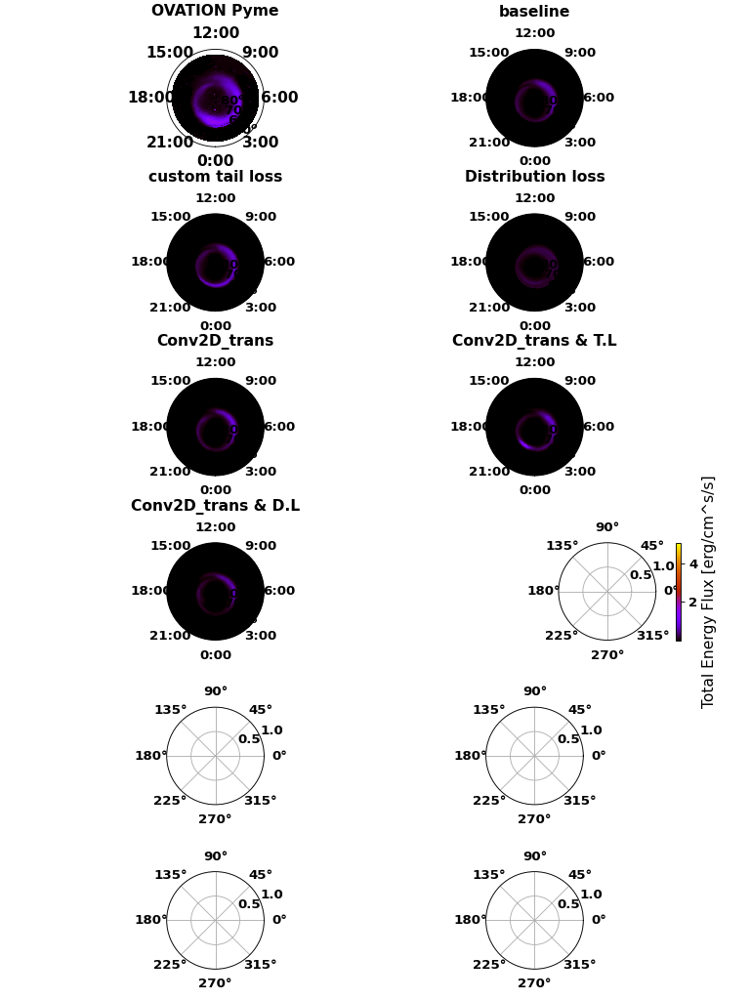

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


Correction Applied


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


2010-01-30 08:01:00


<IPython.core.display.Javascript object>


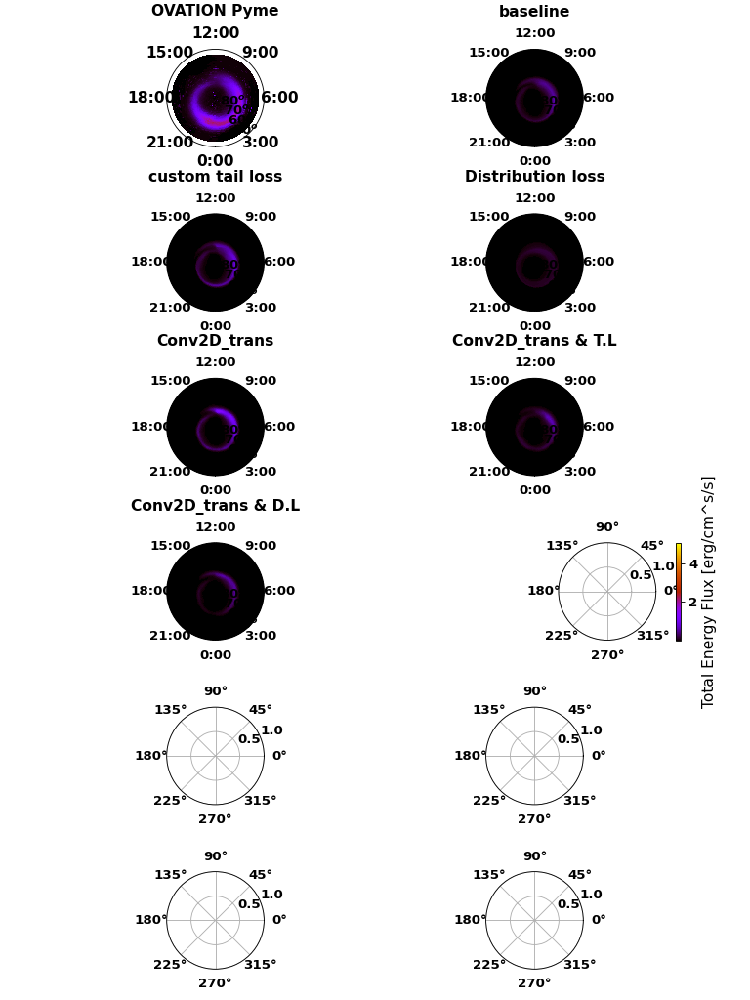

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-02-14 22:35:00


<IPython.core.display.Javascript object>


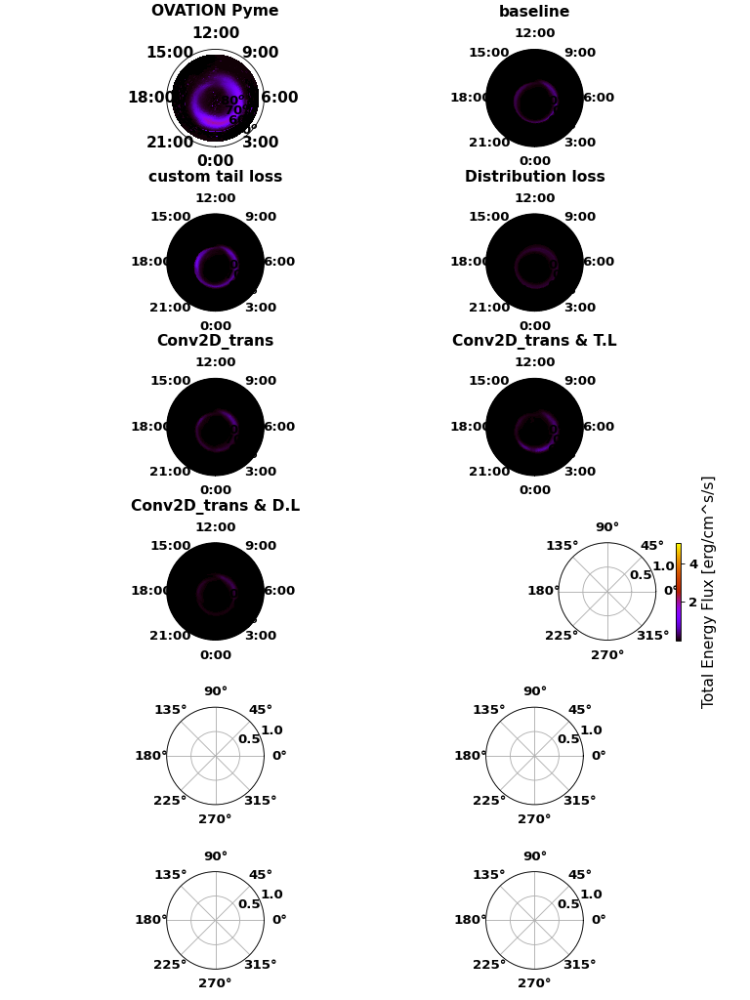

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-02-25 23:33:00


<IPython.core.display.Javascript object>


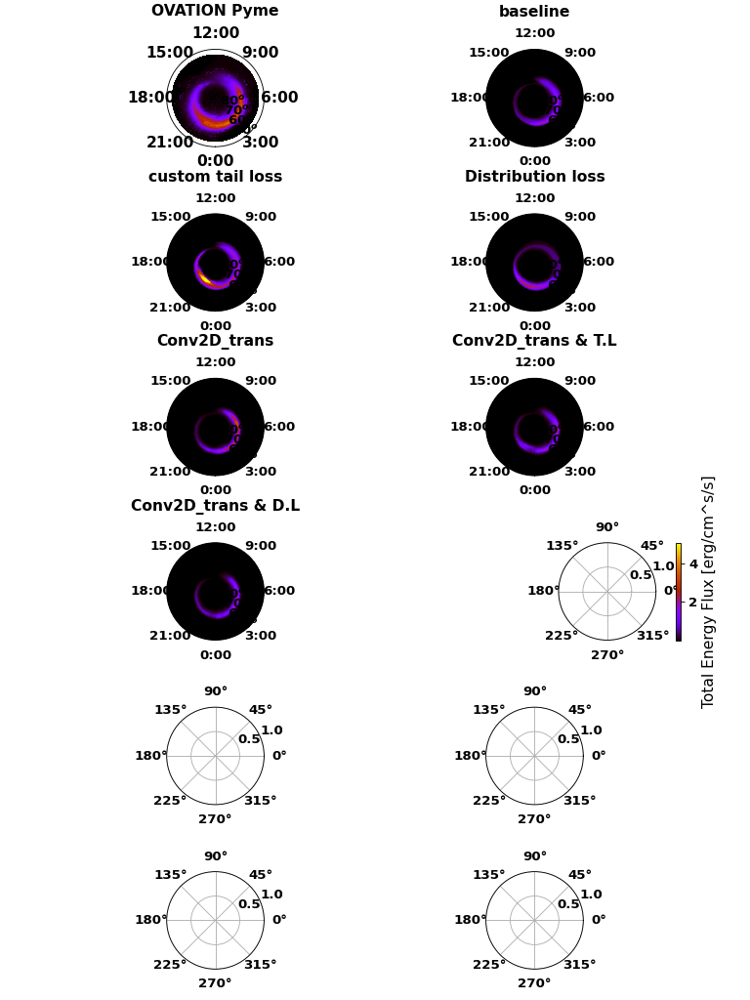

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-03-13 05:54:00


<IPython.core.display.Javascript object>


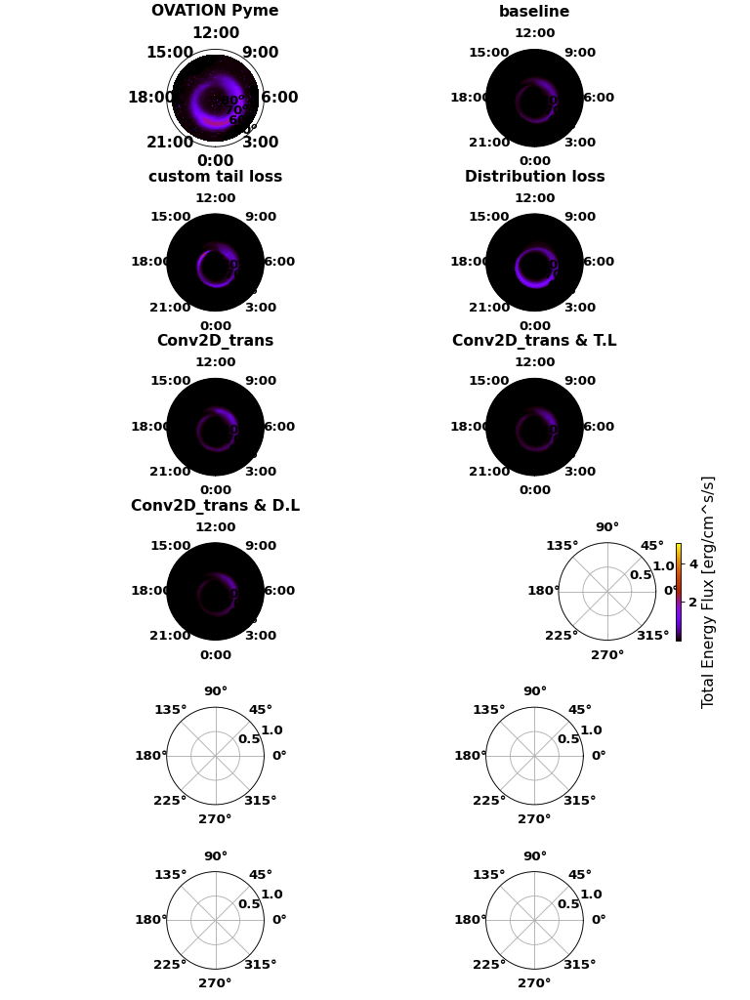

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-03-28 08:34:00


<IPython.core.display.Javascript object>


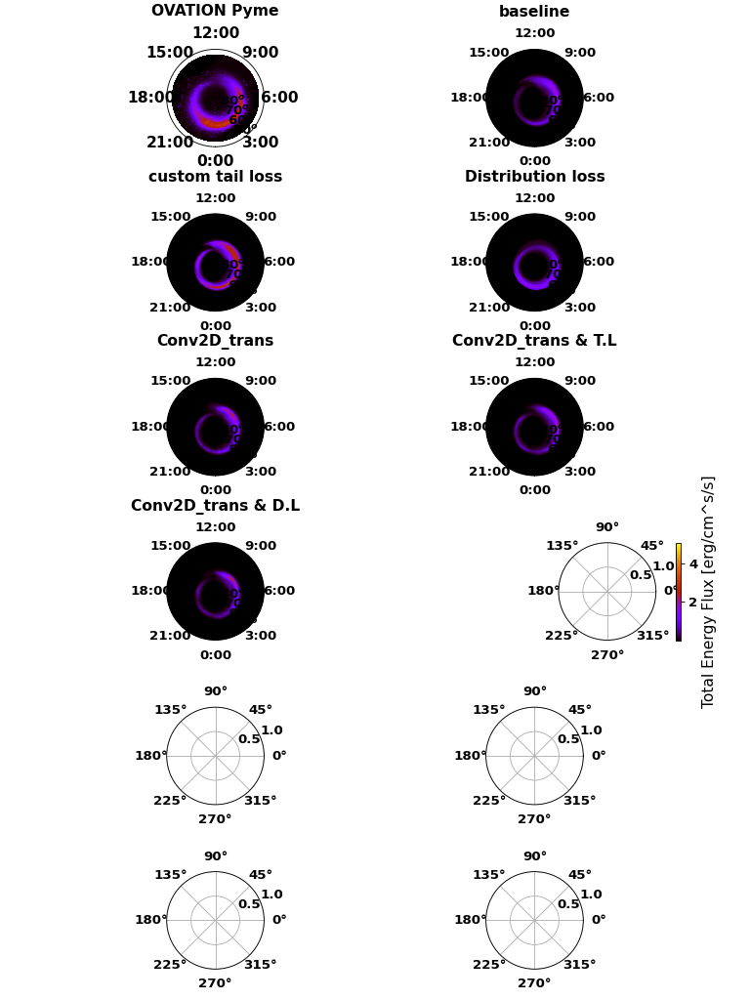

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-05-10 01:58:00


<IPython.core.display.Javascript object>


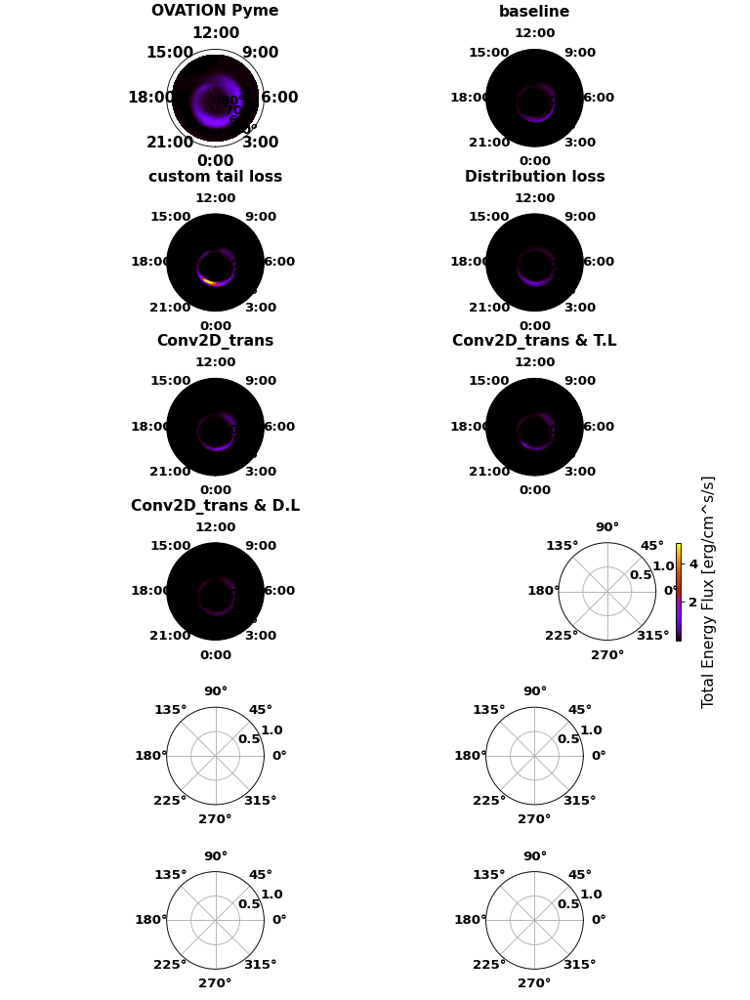

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-06-05 03:09:00


<IPython.core.display.Javascript object>


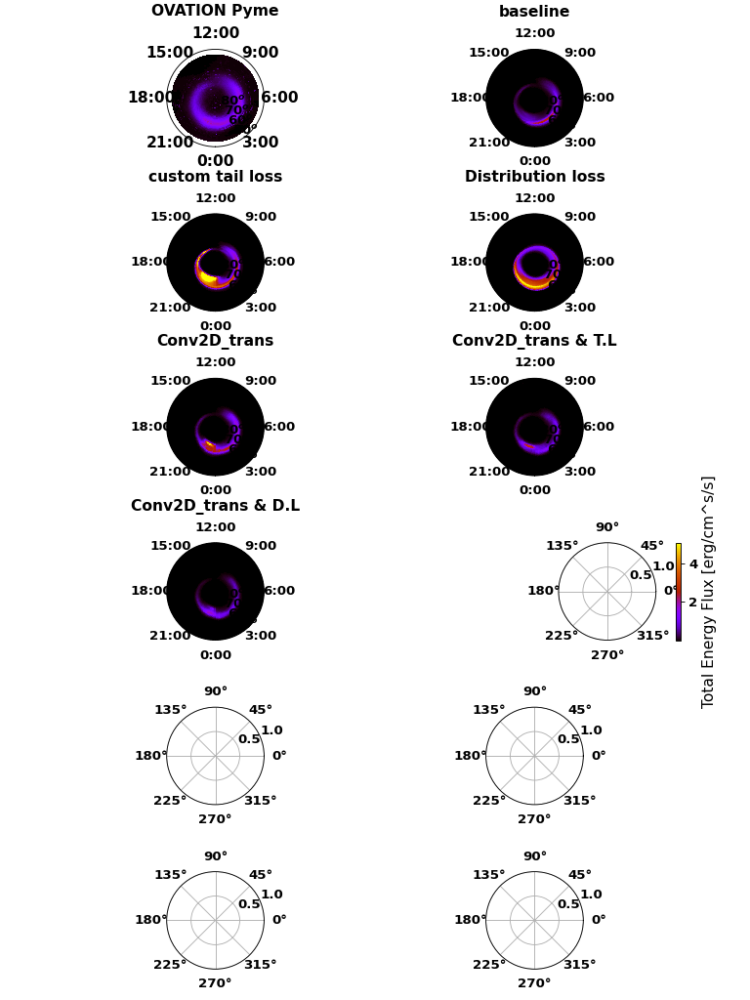

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-07-04 18:27:00


<IPython.core.display.Javascript object>


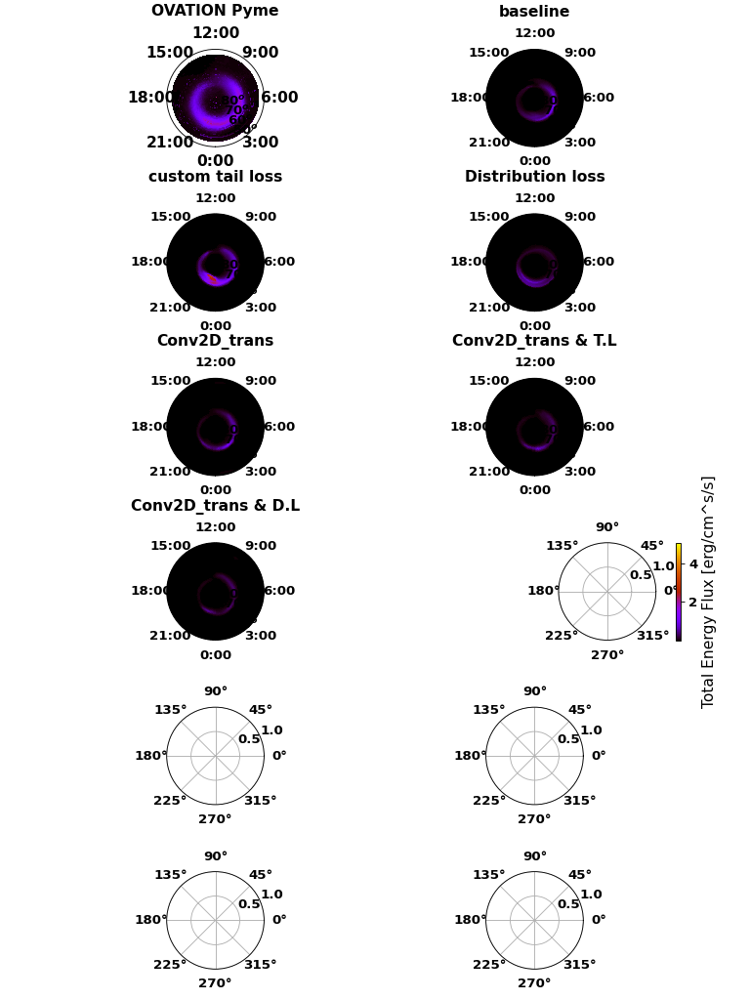

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-08-01 18:29:00


<IPython.core.display.Javascript object>


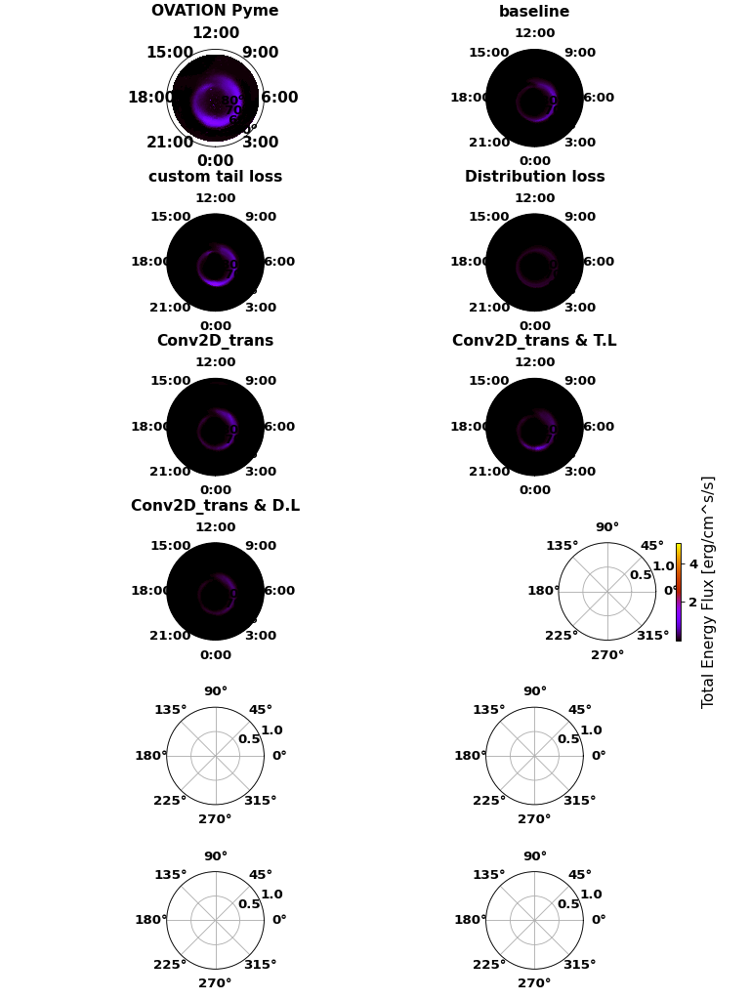

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-08-20 09:07:00


<IPython.core.display.Javascript object>


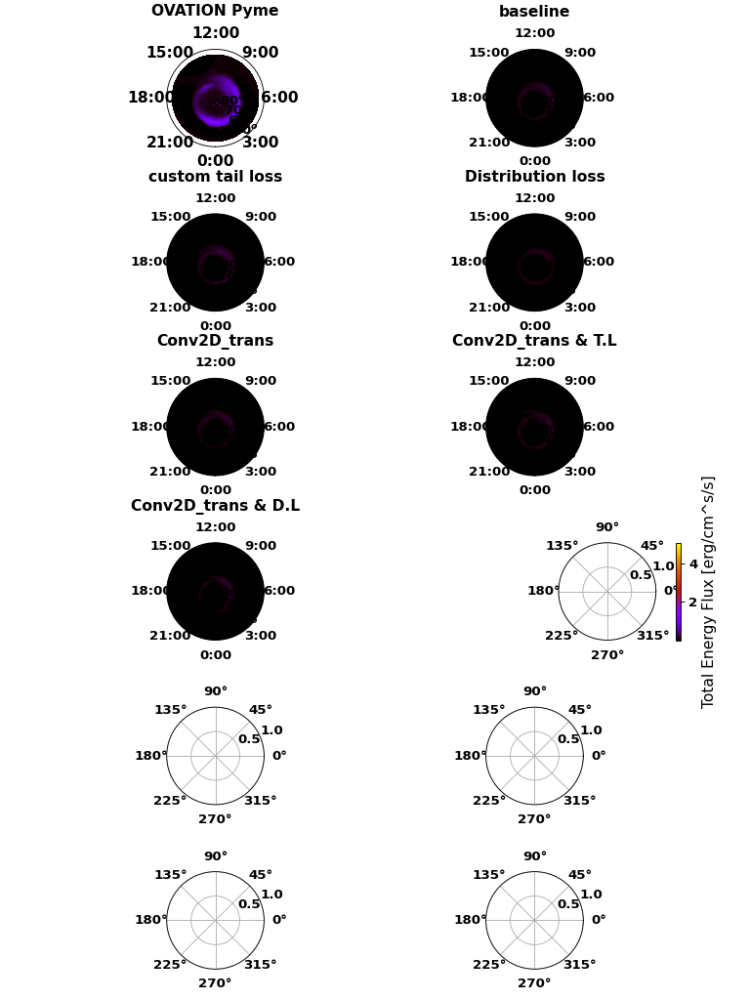

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-10-02 20:27:00


<IPython.core.display.Javascript object>


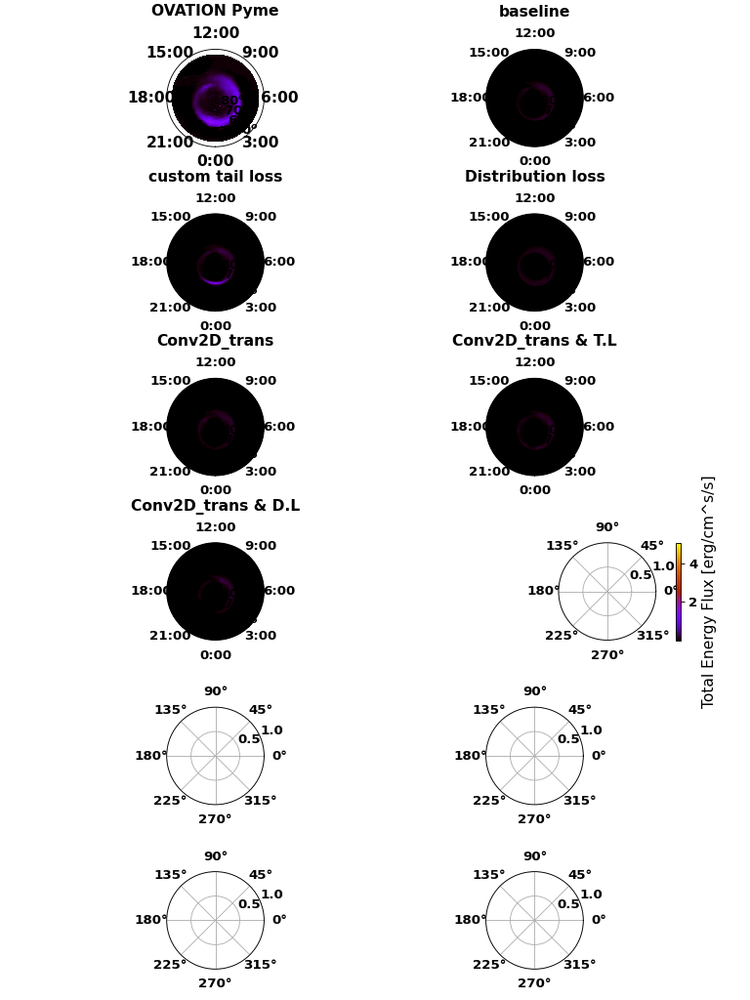

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-11-08 00:33:00


<IPython.core.display.Javascript object>


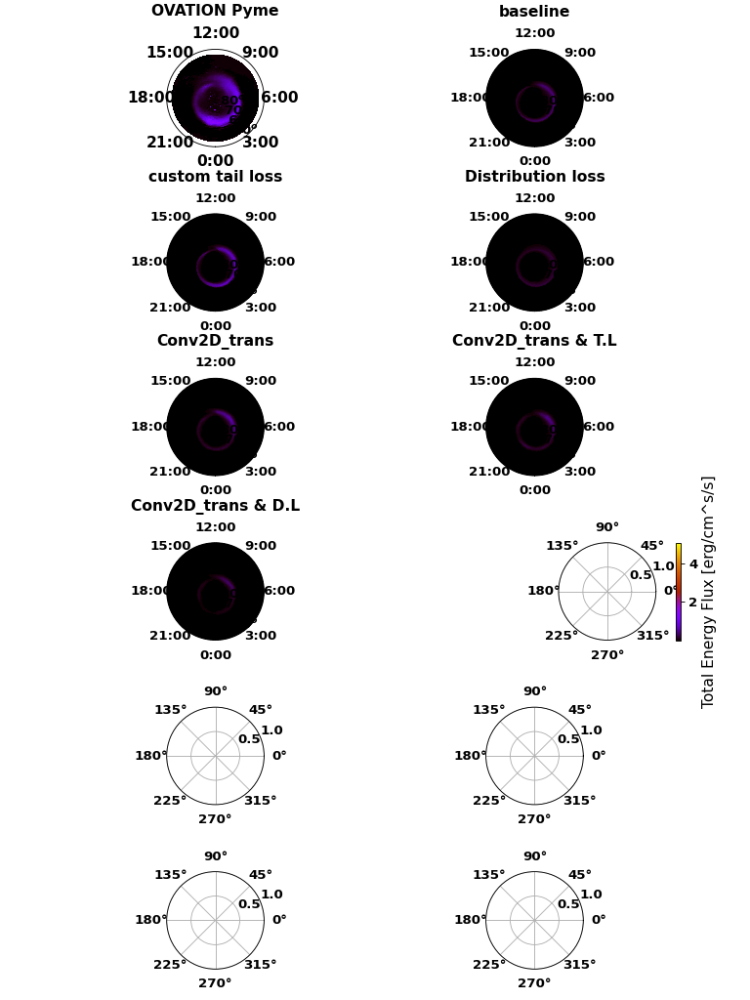

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-11-25 10:35:00


<IPython.core.display.Javascript object>


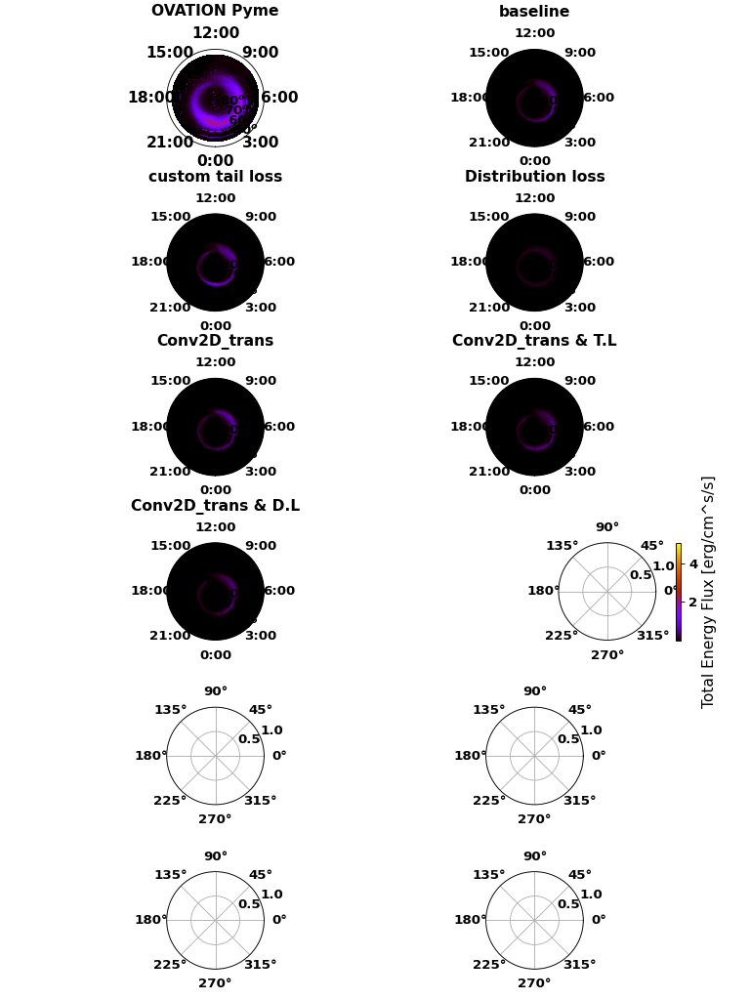

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied
2010-12-12 14:57:00


<IPython.core.display.Javascript object>


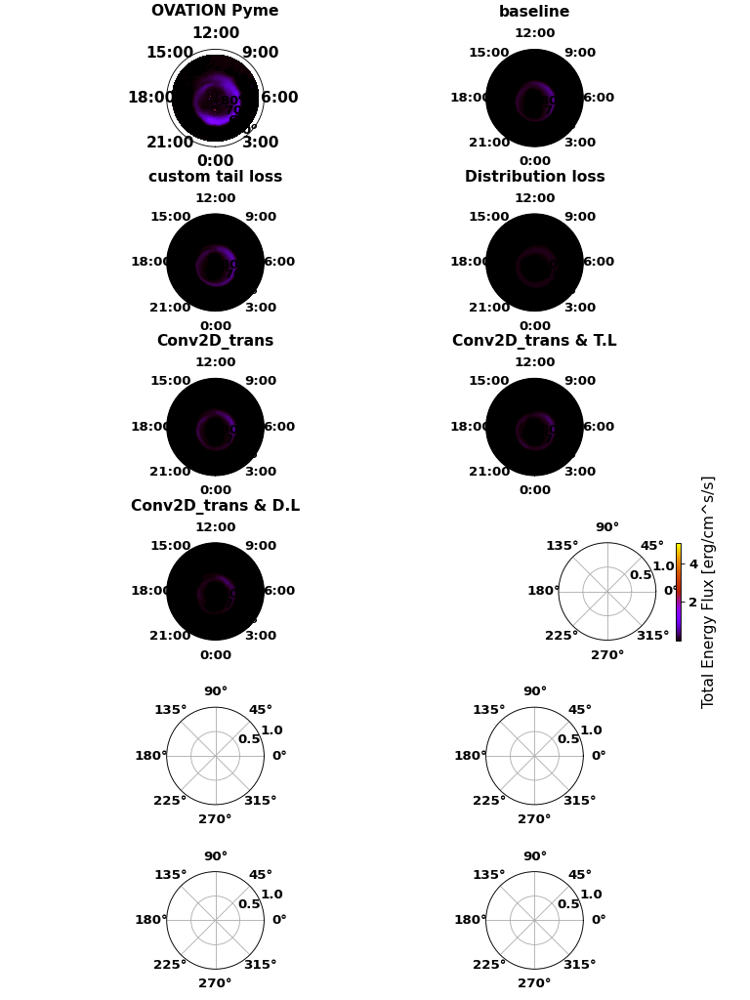

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


In [10]:
plot_model_multiple_polar_no_log_scale(models,model_names, scalars, model_input_keys, dims, model_pipeline,df_val[60*30:(df_val.shape[0]):60*60])


0 2010-01-10 17:13:00
2010-01-10 17:13:00


<IPython.core.display.Javascript object>


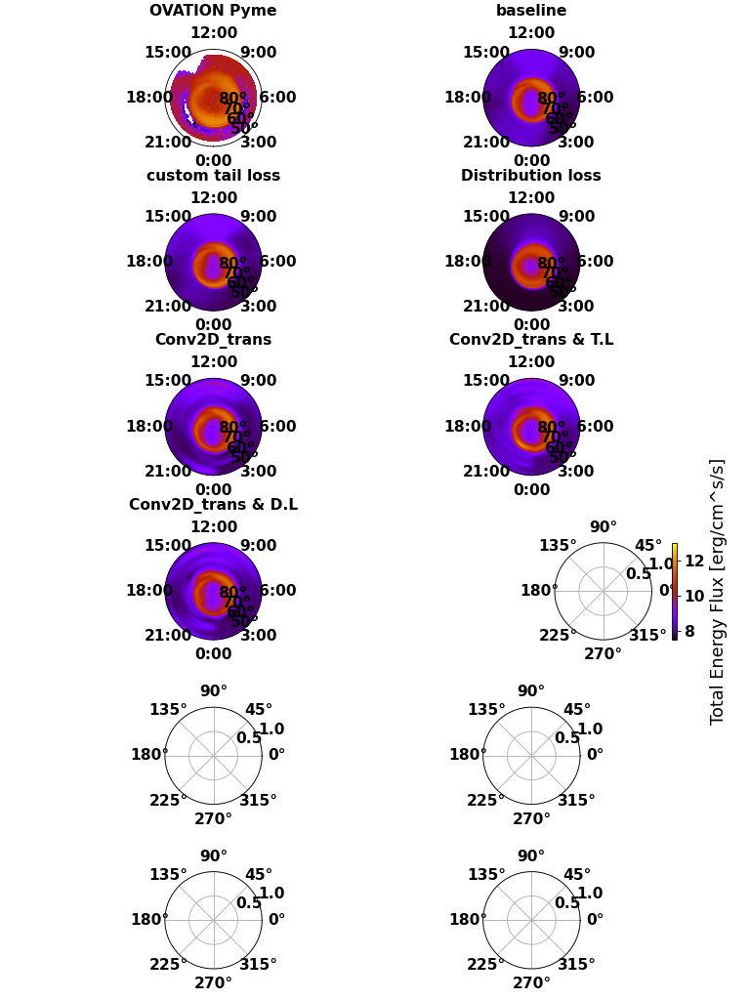

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


1 2010-01-30 08:01:00
2010-01-30 08:01:00


<IPython.core.display.Javascript object>


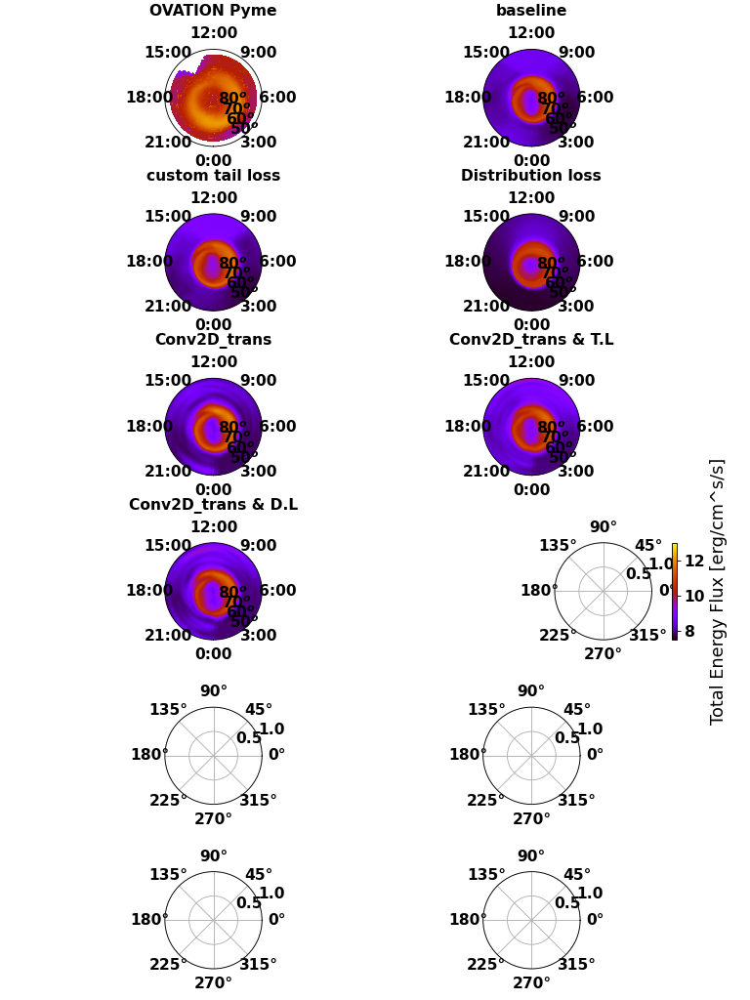

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


2 2010-02-14 22:35:00
2010-02-14 22:35:00


<IPython.core.display.Javascript object>


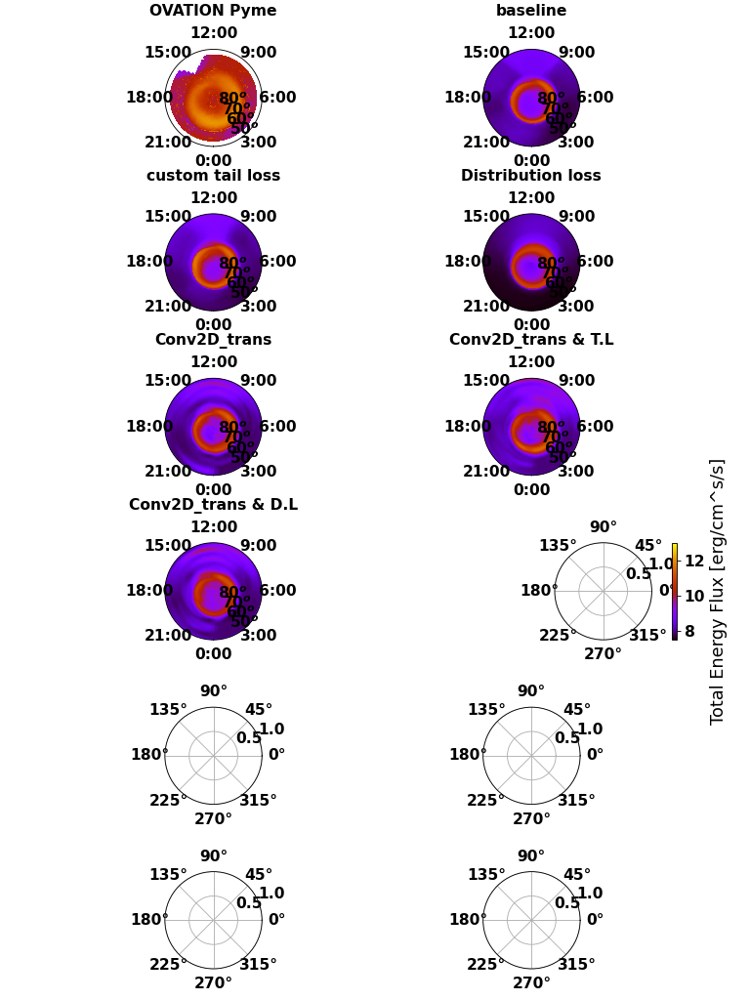

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


3 2010-02-25 23:33:00
2010-02-25 23:33:00


<IPython.core.display.Javascript object>


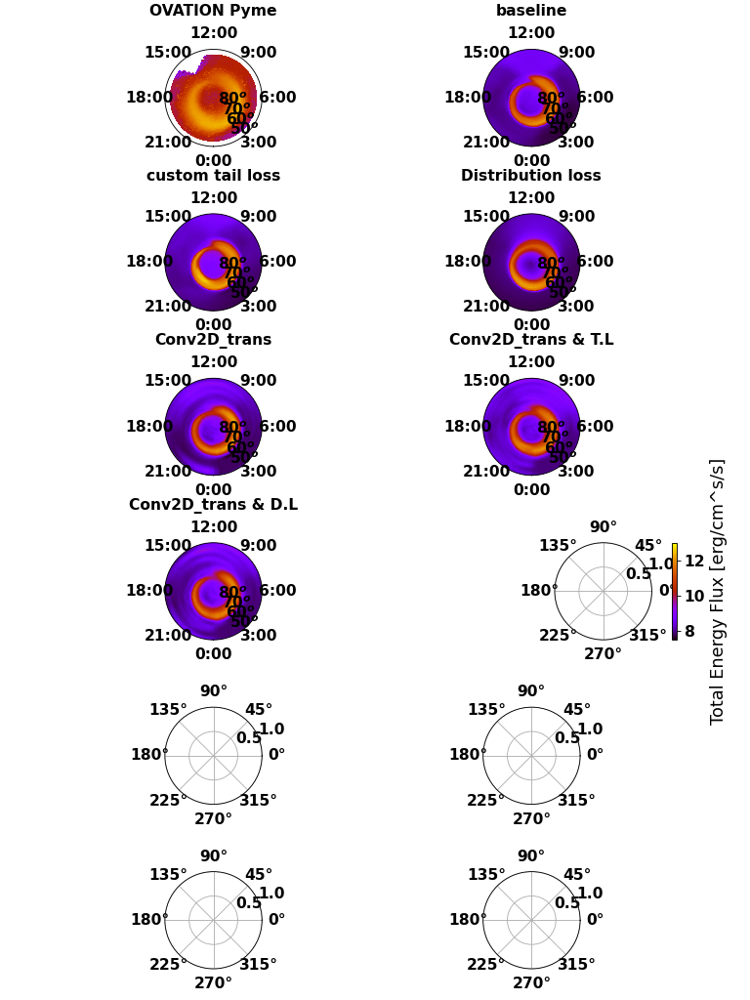

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


4 2010-03-13 05:54:00
2010-03-13 05:54:00


<IPython.core.display.Javascript object>


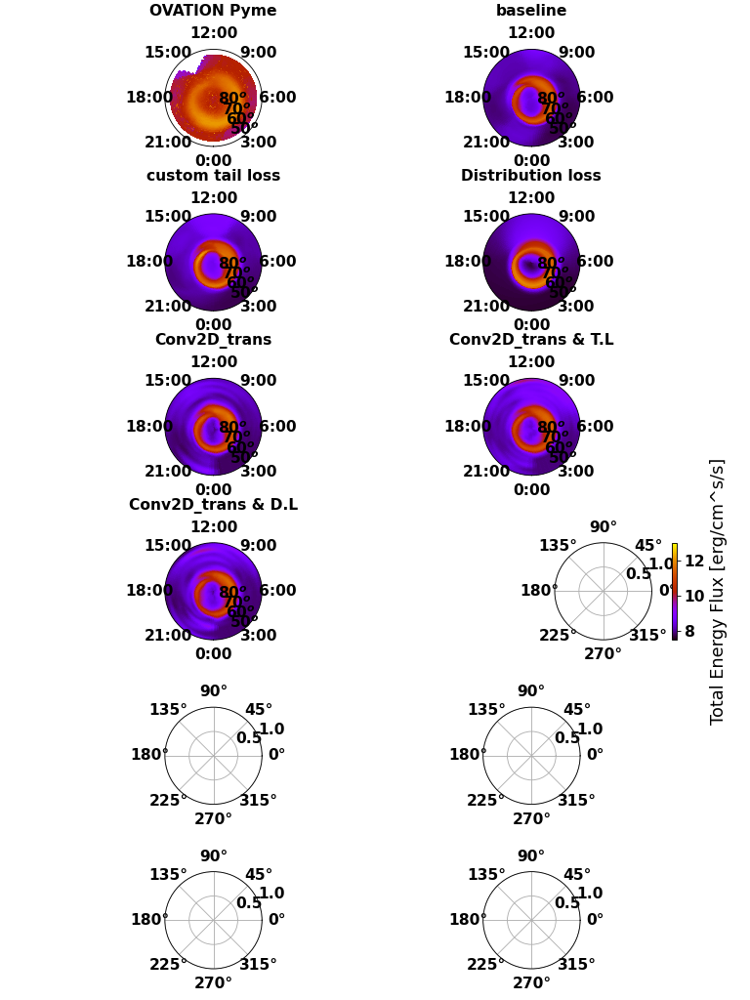

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


5 2010-03-28 08:34:00
2010-03-28 08:34:00


<IPython.core.display.Javascript object>


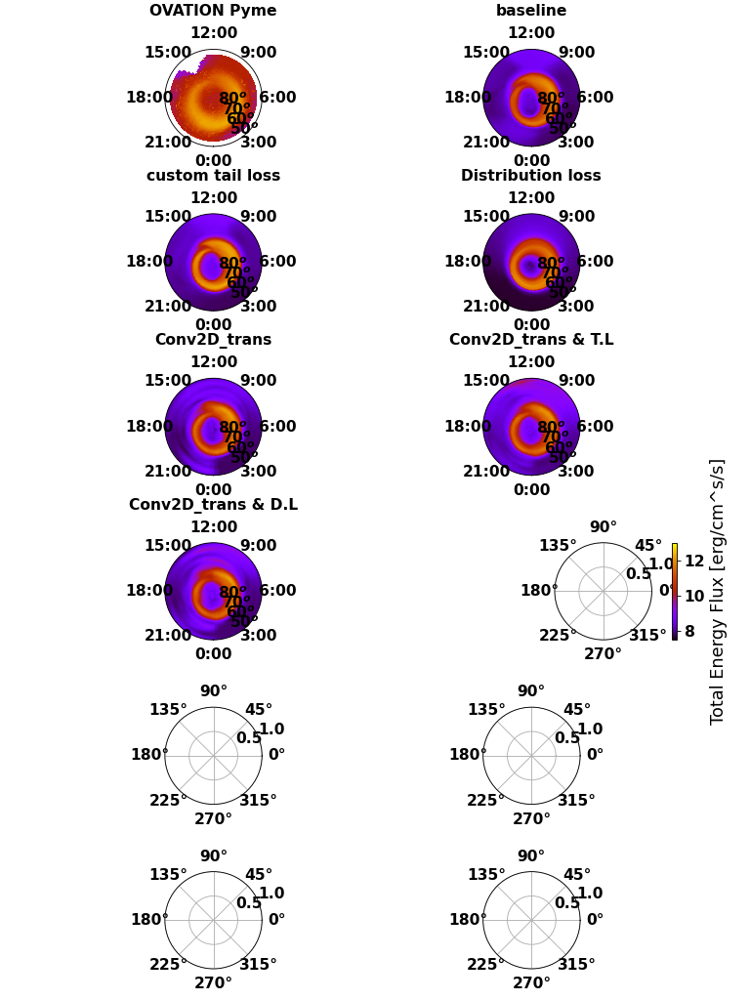

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


6 2010-05-10 01:58:00
2010-05-10 01:58:00


<IPython.core.display.Javascript object>


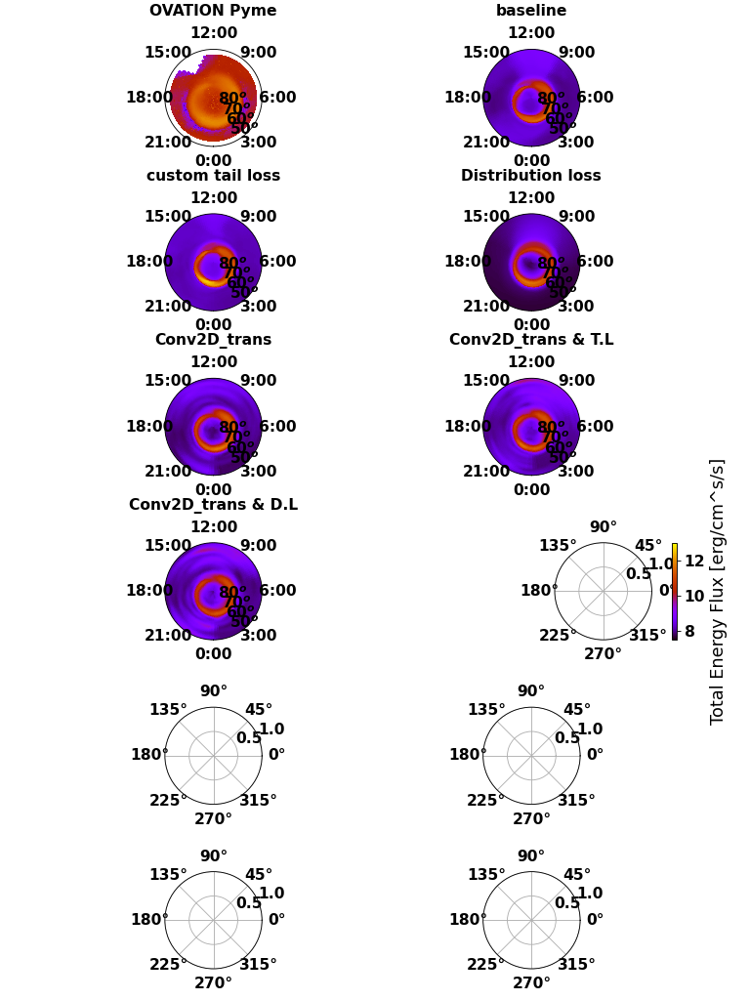

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


7 2010-06-05 03:09:00
2010-06-05 03:09:00


<IPython.core.display.Javascript object>


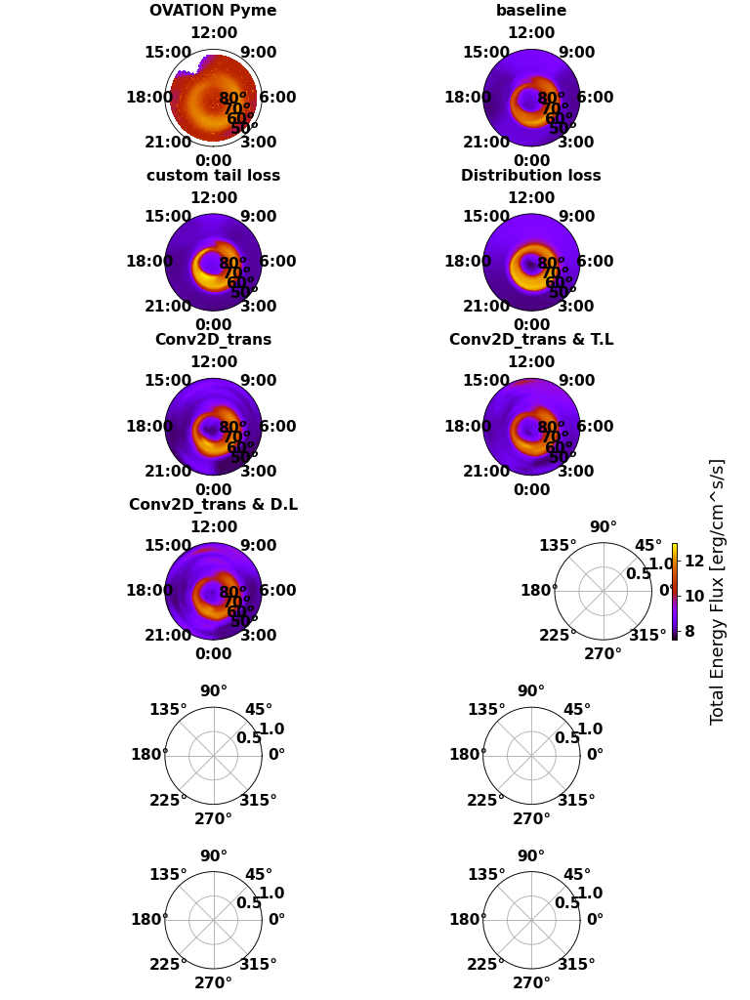

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


8 2010-07-04 18:27:00
2010-07-04 18:27:00


<IPython.core.display.Javascript object>


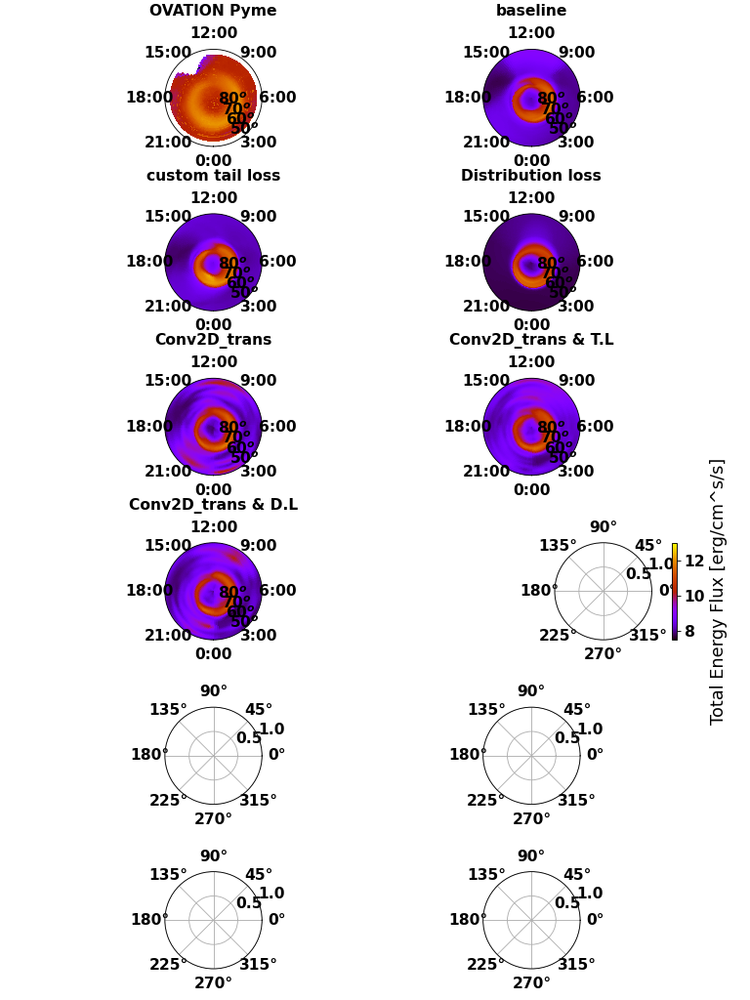

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


9 2010-08-01 18:29:00
2010-08-01 18:29:00


<IPython.core.display.Javascript object>


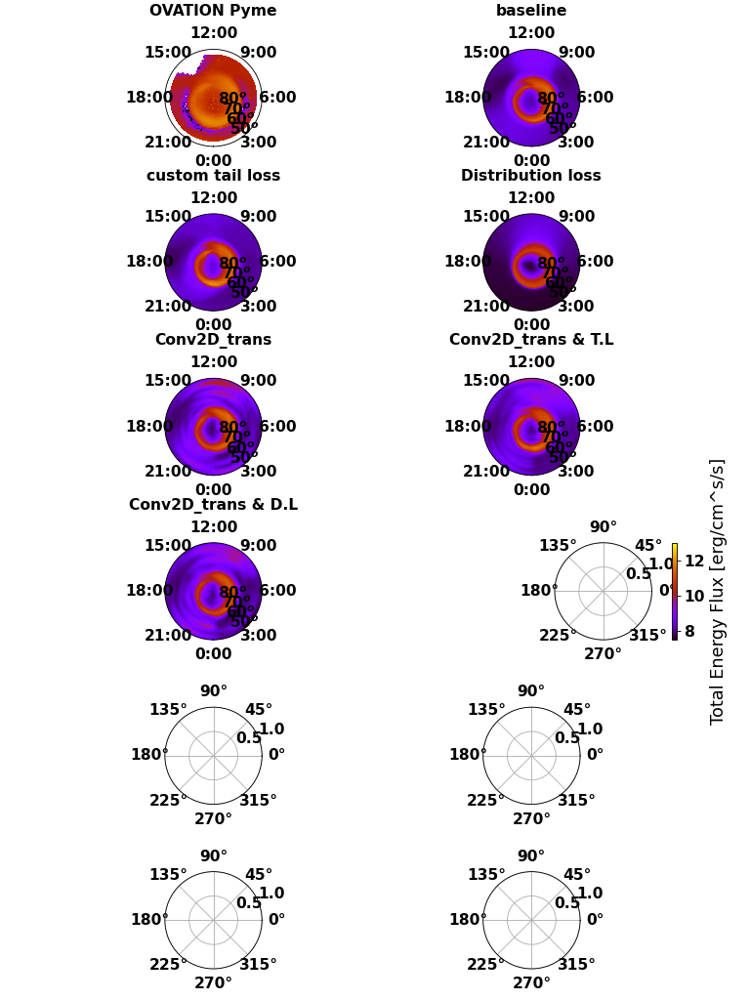

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


10 2010-08-20 09:07:00
2010-08-20 09:07:00


<IPython.core.display.Javascript object>


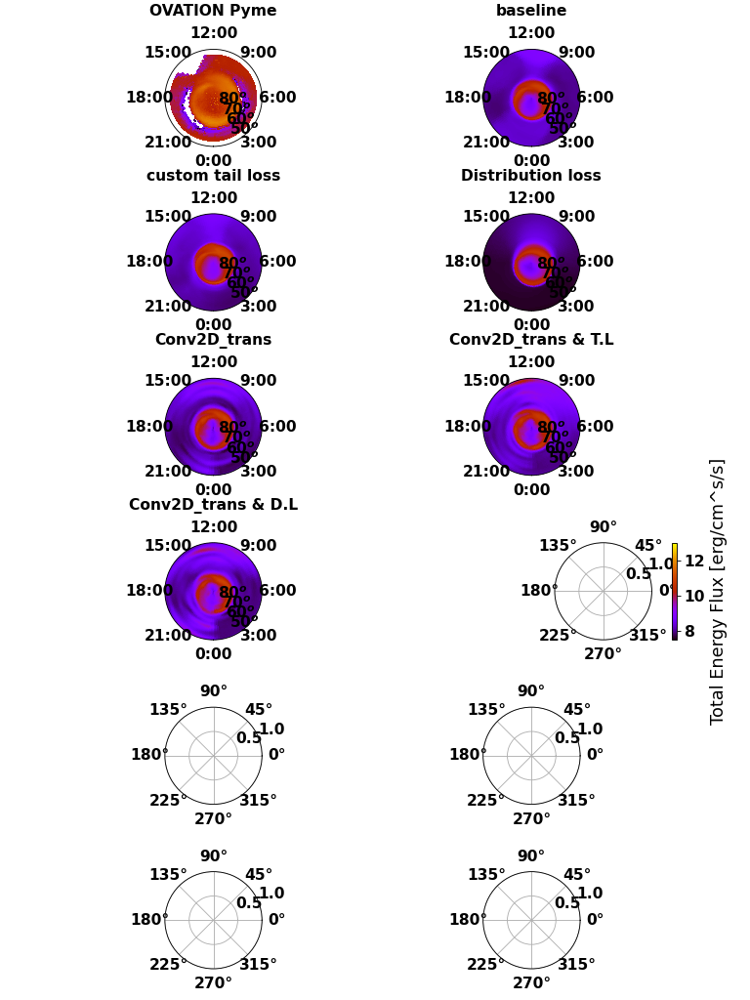

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


11 2010-10-02 20:27:00
2010-10-02 20:27:00


<IPython.core.display.Javascript object>


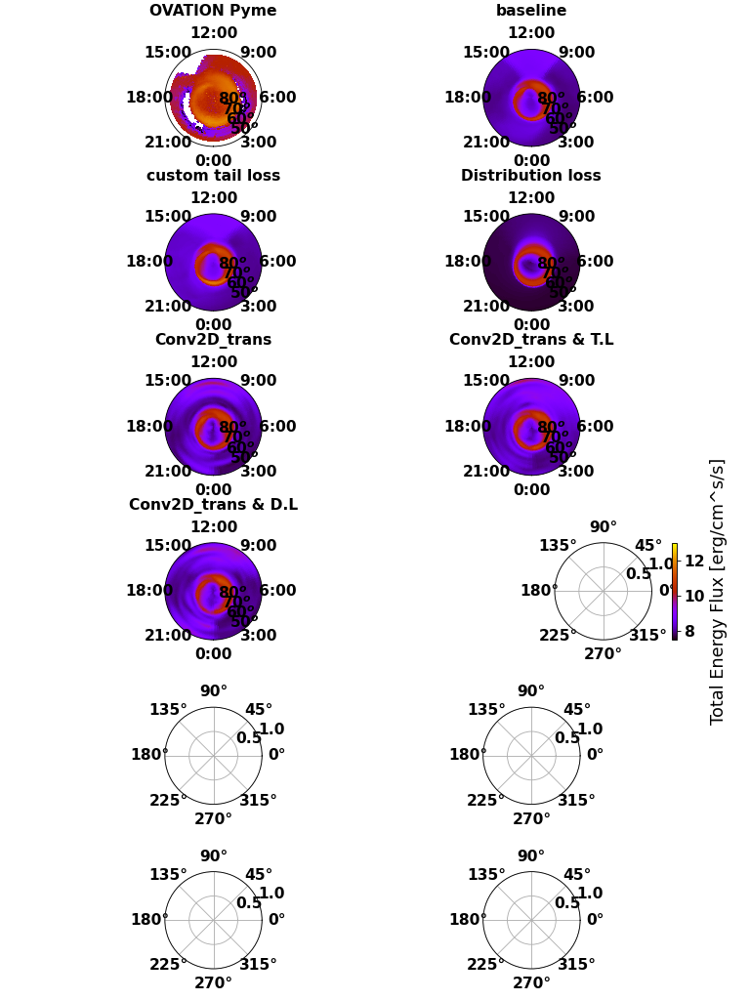

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


12 2010-11-08 00:33:00
2010-11-08 00:33:00


<IPython.core.display.Javascript object>


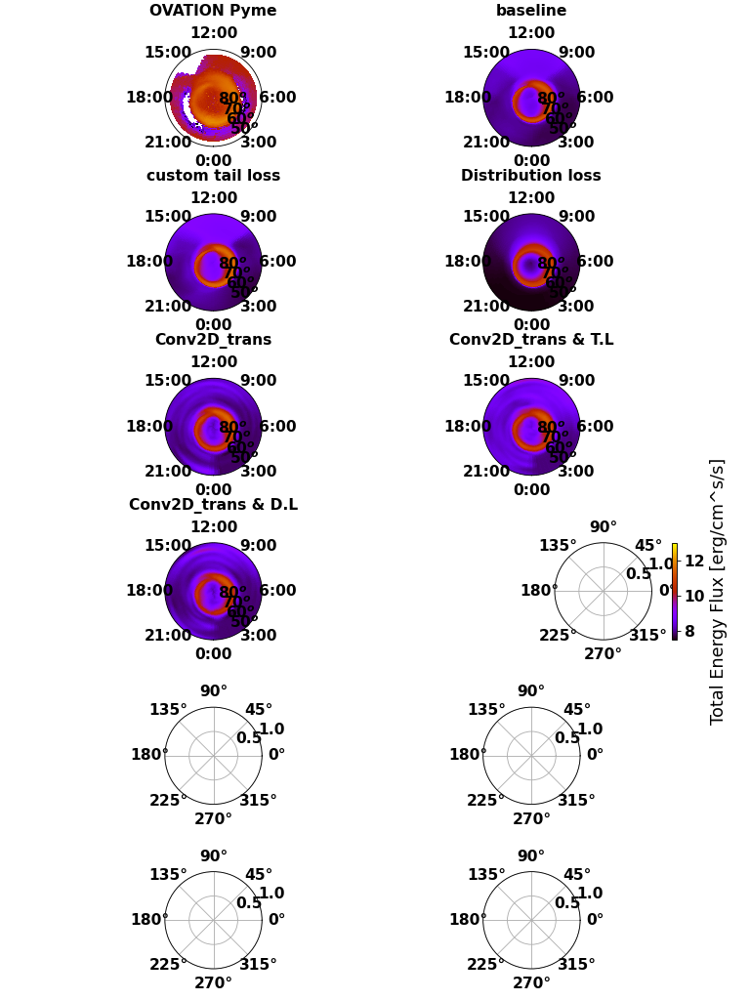

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


13 2010-11-25 10:35:00
2010-11-25 10:35:00


<IPython.core.display.Javascript object>


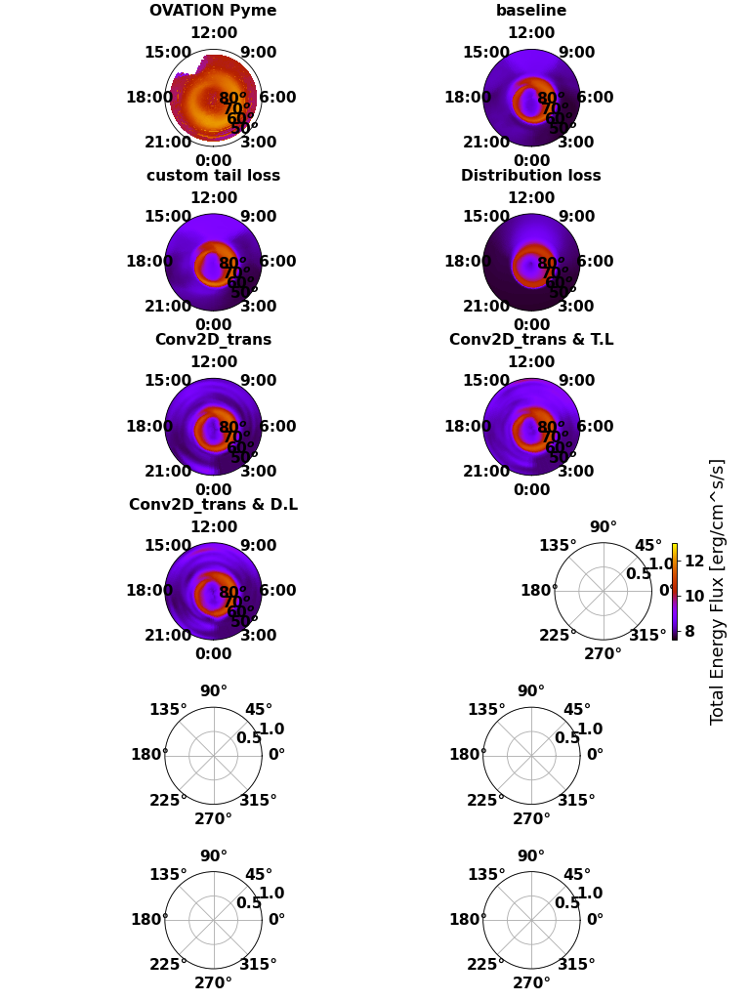

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


14 2010-12-12 14:57:00
2010-12-12 14:57:00


<IPython.core.display.Javascript object>


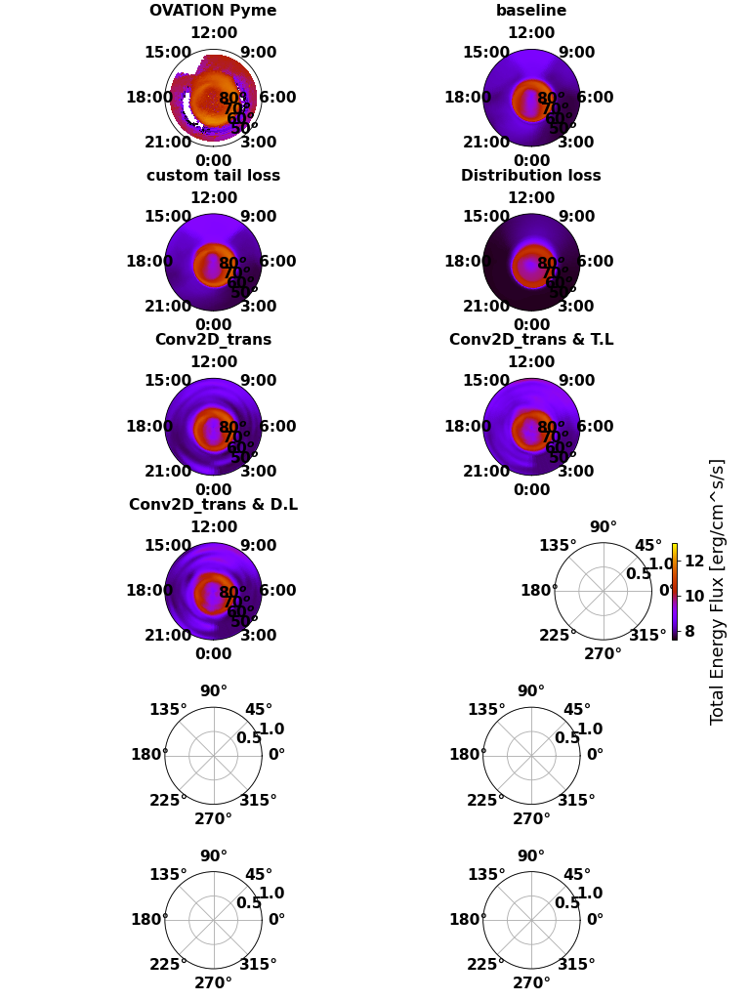

baseline


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


custom tail loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)


Distribution loss


/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-packages/ovationpyme-0.1.0-py3.6.egg/ovationpyme/ovation_plotting.py:54: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  mappable = ax.pcolormesh(thetagrid,rgrid,fluxgrid,**pcolor_kwargs)
/usr/local/lib/python3.6/dist-

Conv2D_trans
Conv2D_trans & T.L
Conv2D_trans & D.L
Correction Applied
Correction Applied
Correction Applied


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:171: RuntimeWarning: divide by zero encountered in log10


In [66]:
#ploting every minute below
plot_model_multiple_polar(models,model_names, scalars, model_input_keys, dims, model_pipeline,df_val[60*30:(df_val.shape[0]):60*60])


In [67]:
model_names

['baseline',
 'custom tail loss',
 'Distribution loss',
 'Conv2D_trans',
 'Conv2D_trans & T.L',
 'Conv2D_trans & D.L']

In [ ]:
model_names = ['Baseline',
 'Tail loss',
 'Dist loss',
 'Conv2D',
 'Conv2D & TL']

<IPython.core.display.Javascript object>


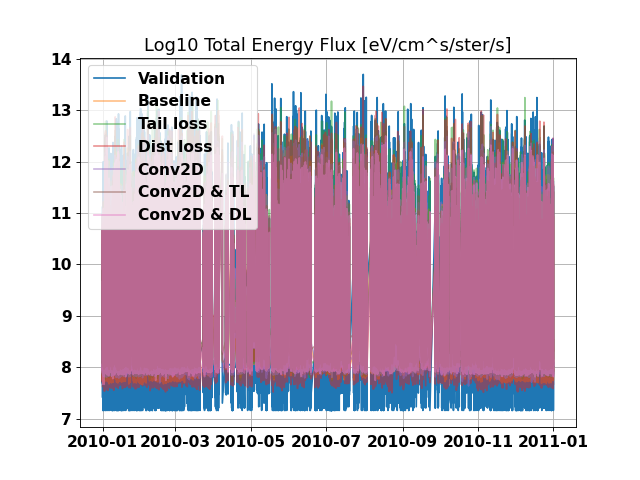

<IPython.core.display.Javascript object>


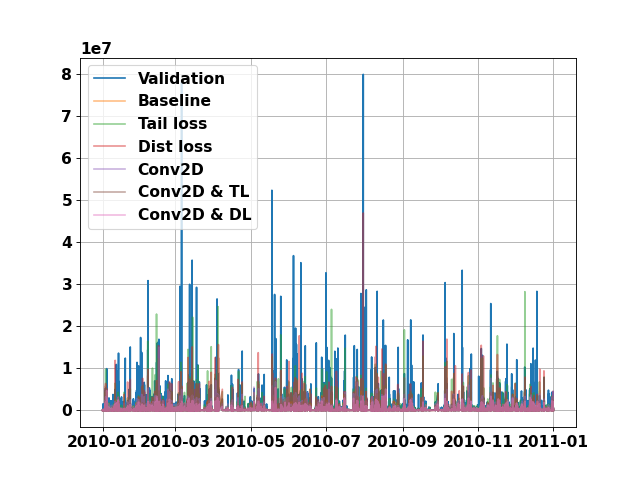

<IPython.core.display.Javascript object>


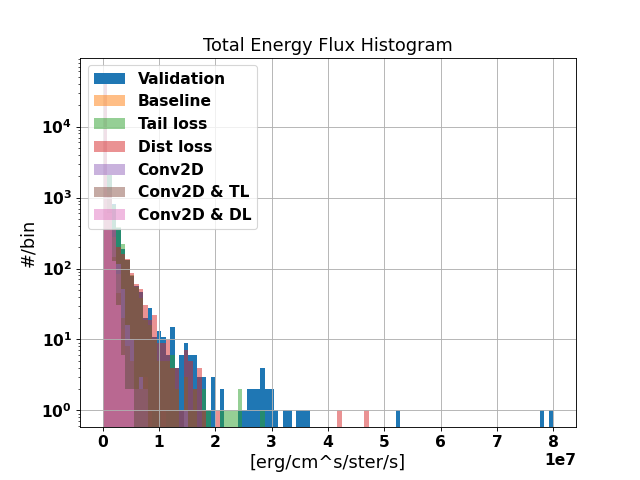

<IPython.core.display.Javascript object>


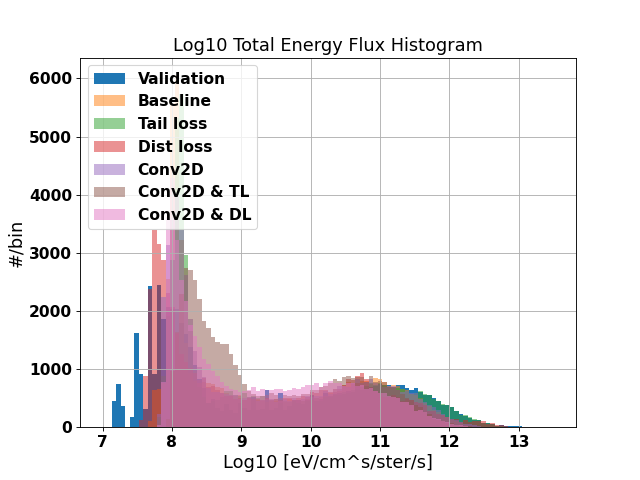

<IPython.core.display.Javascript object>


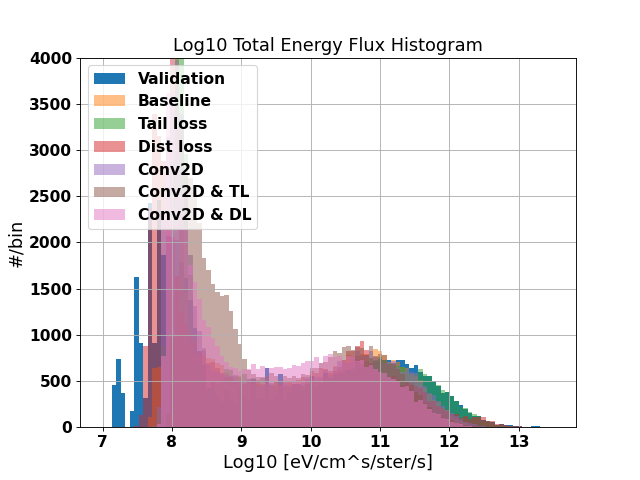

<IPython.core.display.Javascript object>


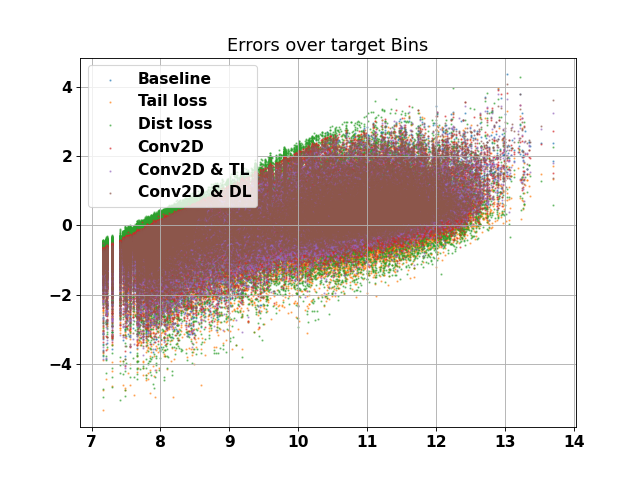

<IPython.core.display.Javascript object>


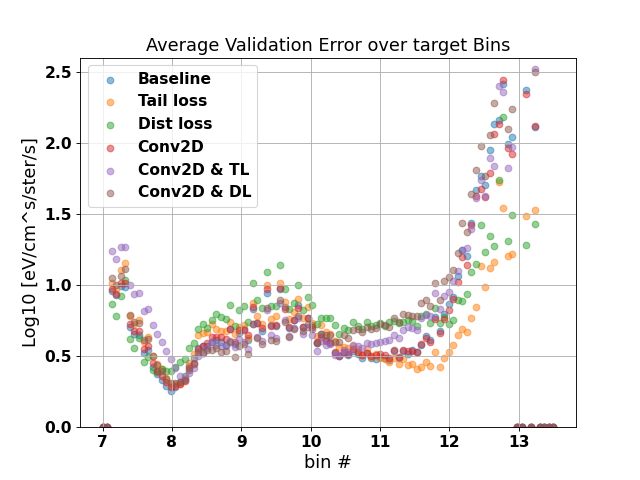

<IPython.core.display.Javascript object>


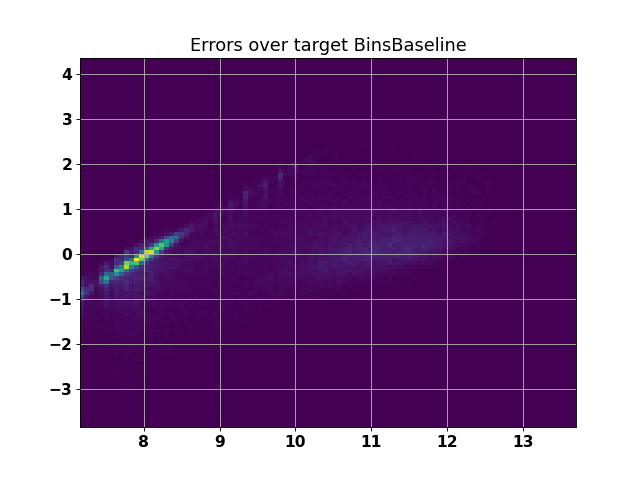

<IPython.core.display.Javascript object>


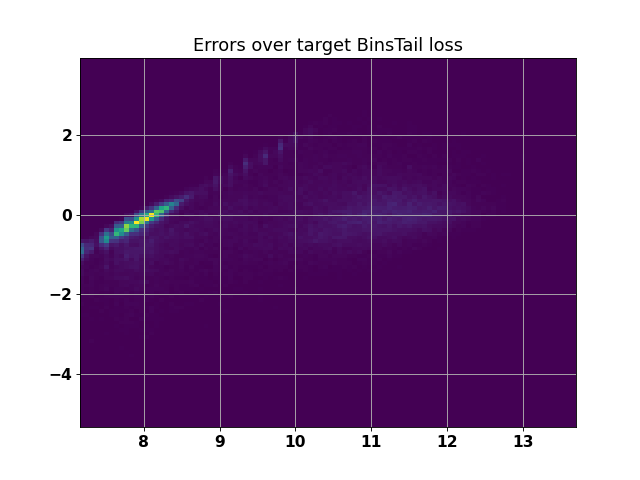

<IPython.core.display.Javascript object>


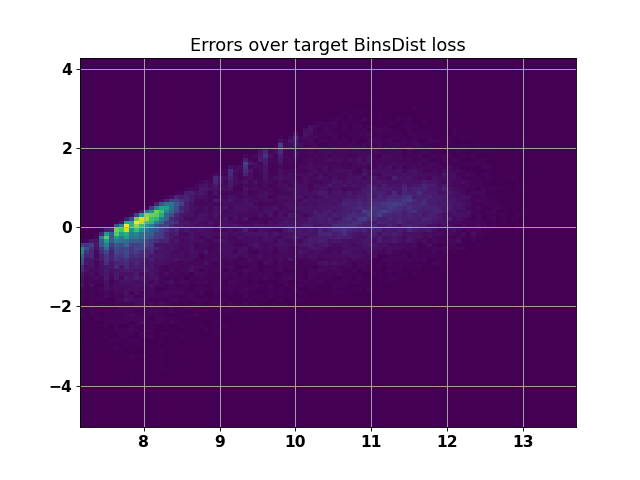

<IPython.core.display.Javascript object>


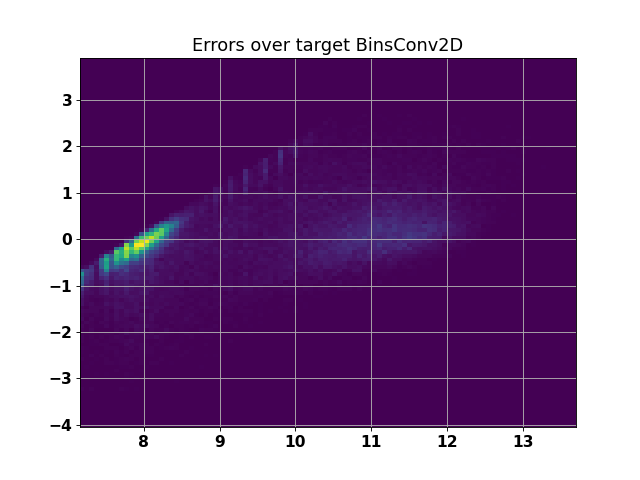

<IPython.core.display.Javascript object>


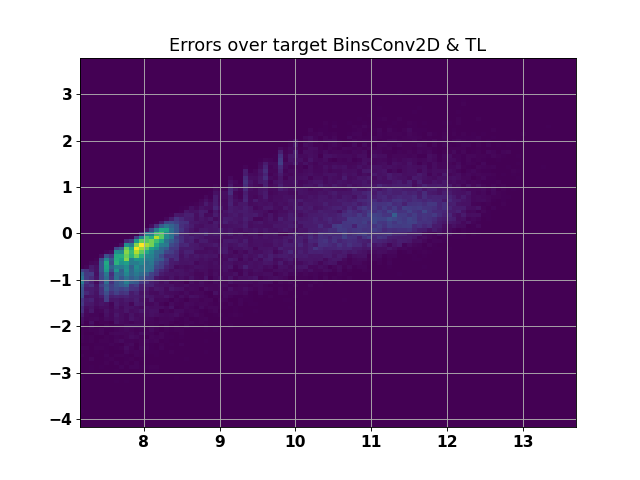

<IPython.core.display.Javascript object>


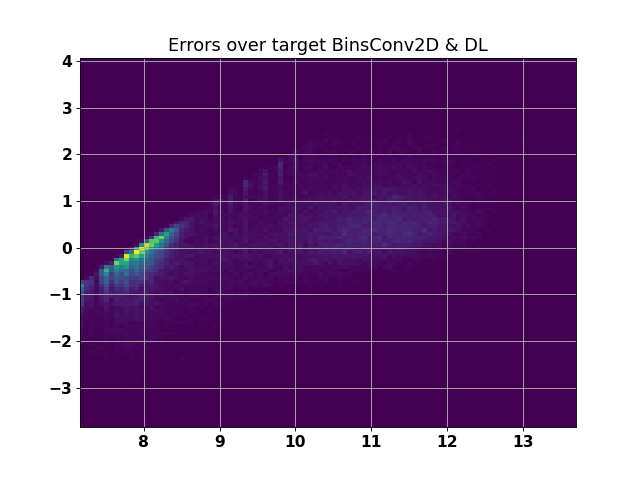

<IPython.core.display.Javascript object>


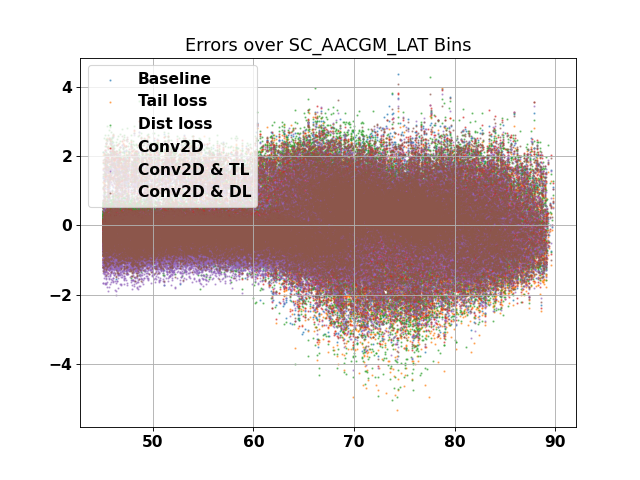

<IPython.core.display.Javascript object>


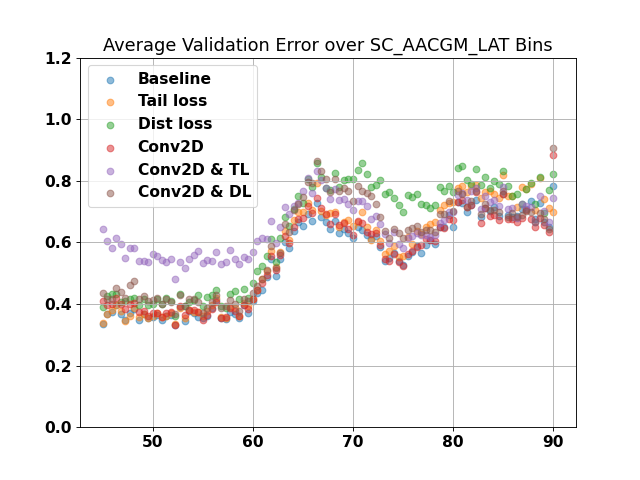

In [96]:
plot_model_multiple(All_results,model_names,y_val_log)



<IPython.core.display.Javascript object>


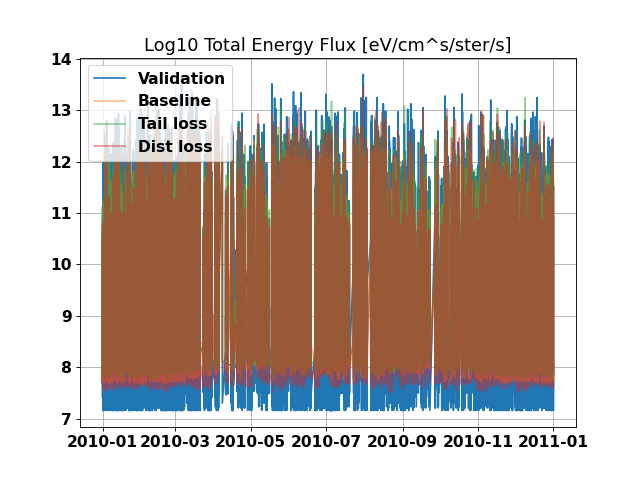

<IPython.core.display.Javascript object>


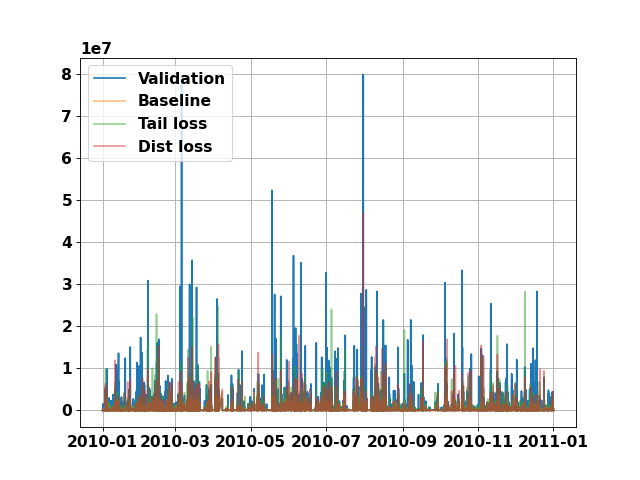

<IPython.core.display.Javascript object>


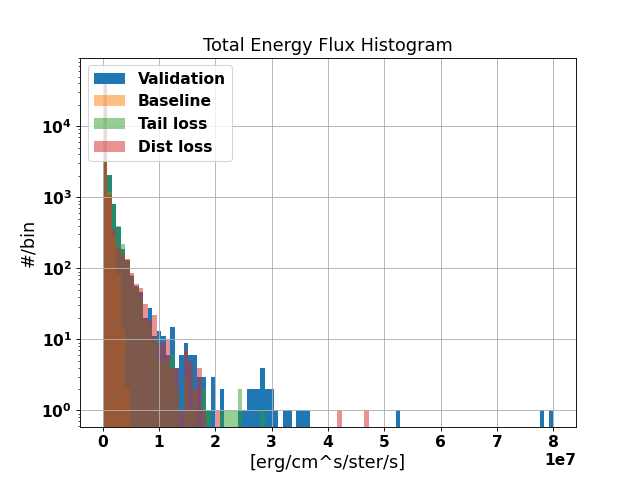

<IPython.core.display.Javascript object>


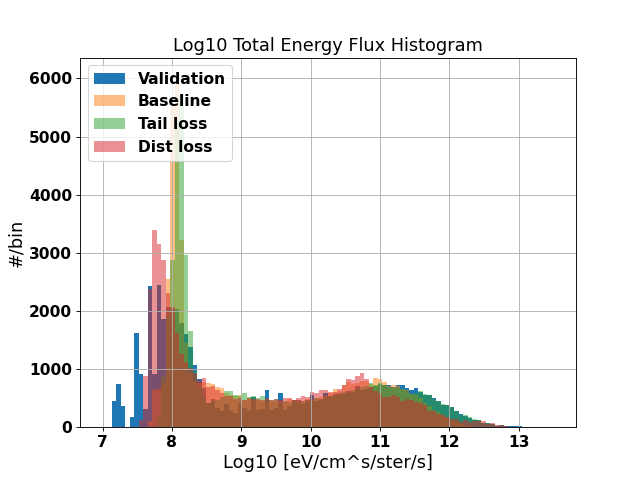

<IPython.core.display.Javascript object>


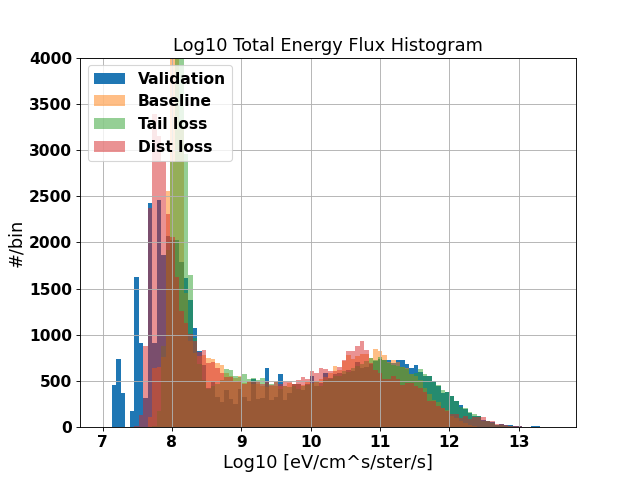

<IPython.core.display.Javascript object>


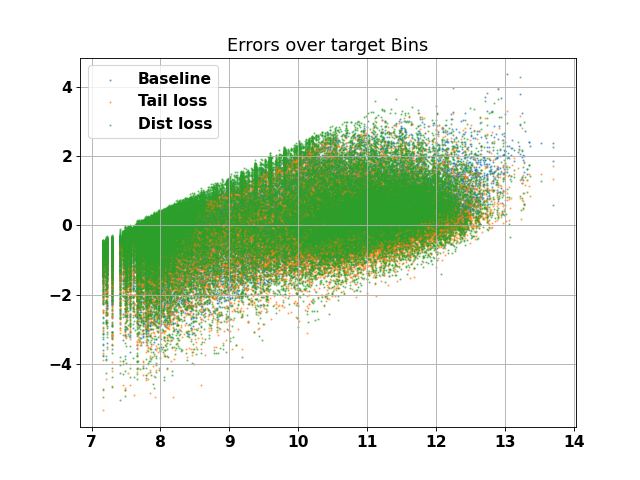

<IPython.core.display.Javascript object>


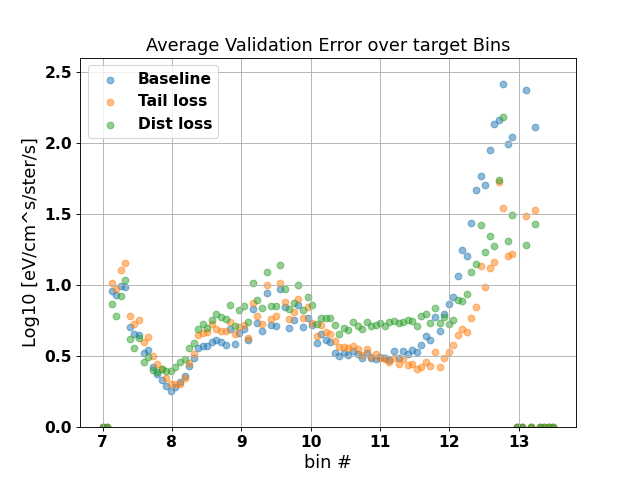

<IPython.core.display.Javascript object>


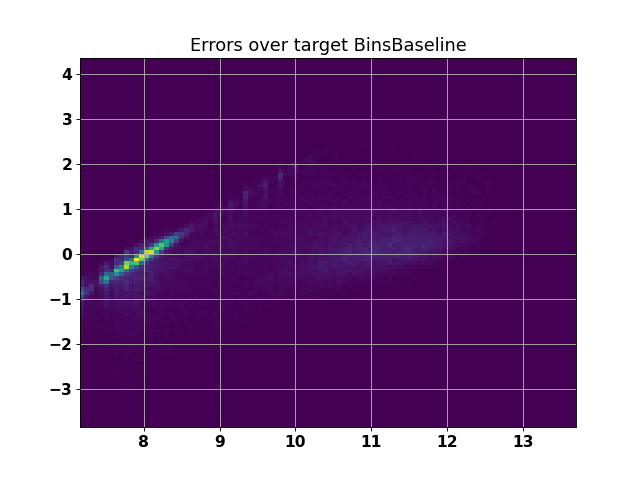

<IPython.core.display.Javascript object>


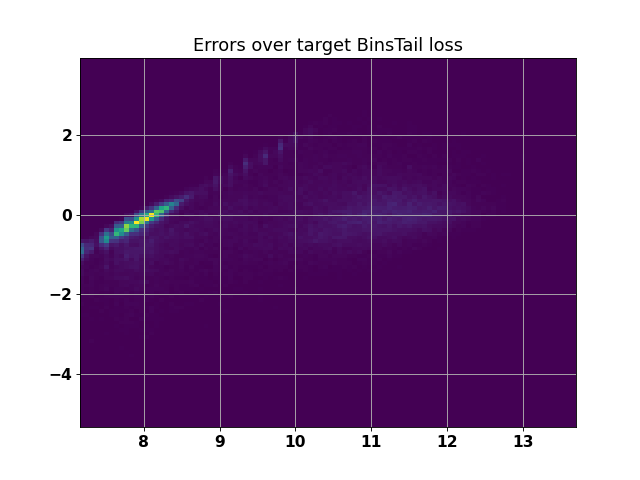

<IPython.core.display.Javascript object>


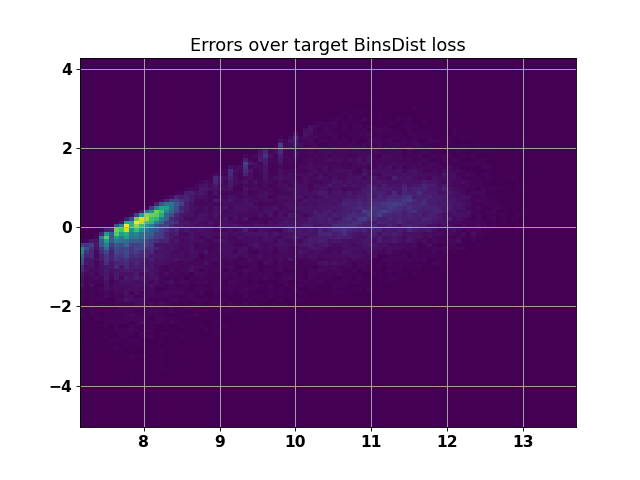

<IPython.core.display.Javascript object>


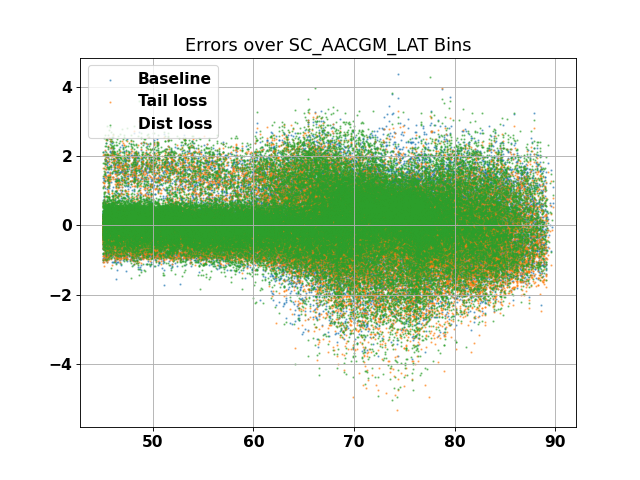

<IPython.core.display.Javascript object>


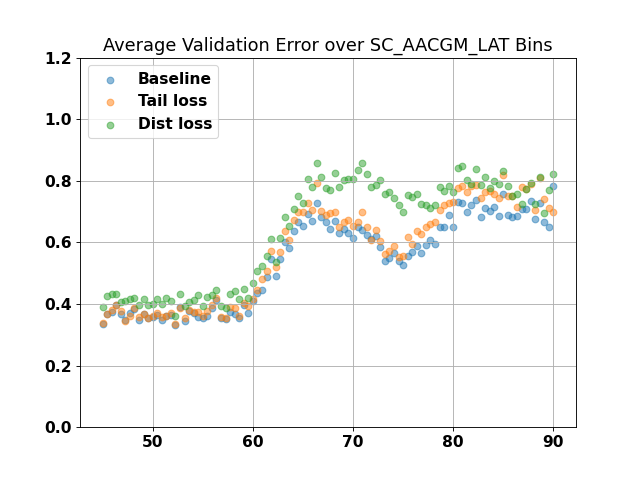

In [95]:
plot_model_multiple(All_results[0:3],model_names[0:3],y_val_log)


<IPython.core.display.Javascript object>


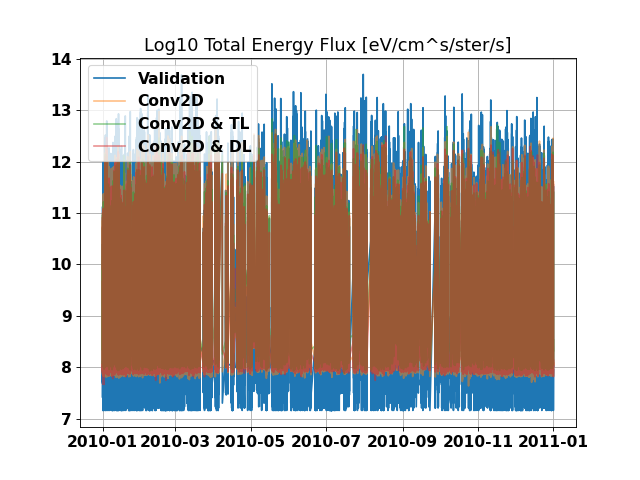

<IPython.core.display.Javascript object>


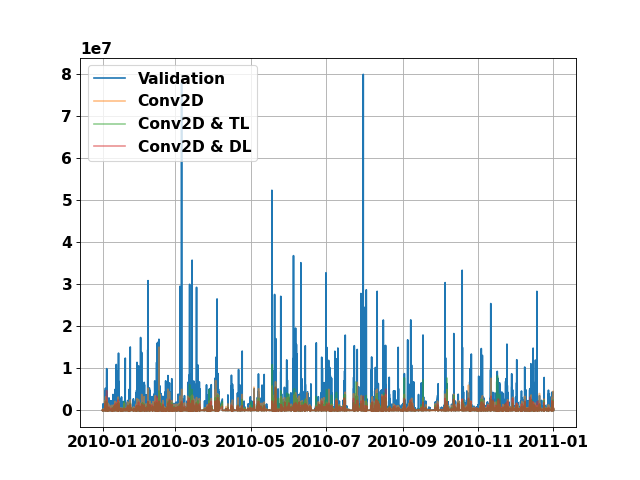

<IPython.core.display.Javascript object>


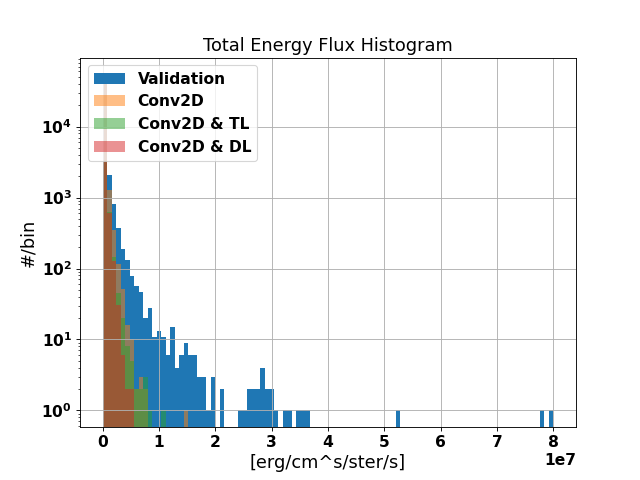

<IPython.core.display.Javascript object>


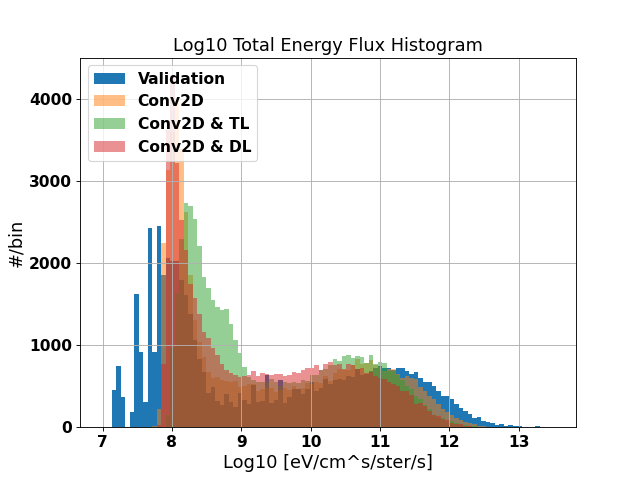

<IPython.core.display.Javascript object>


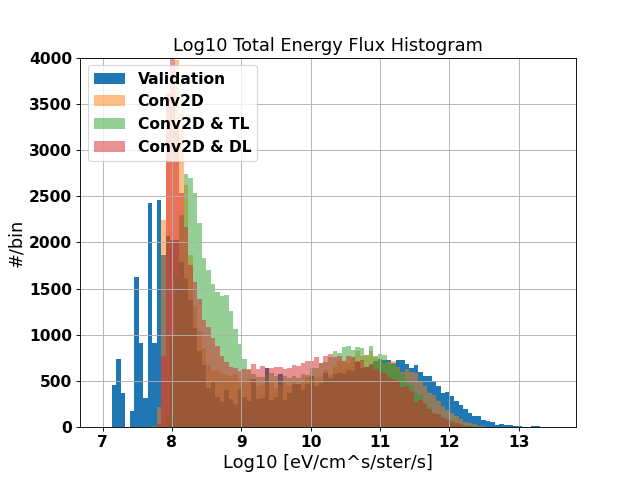

<IPython.core.display.Javascript object>


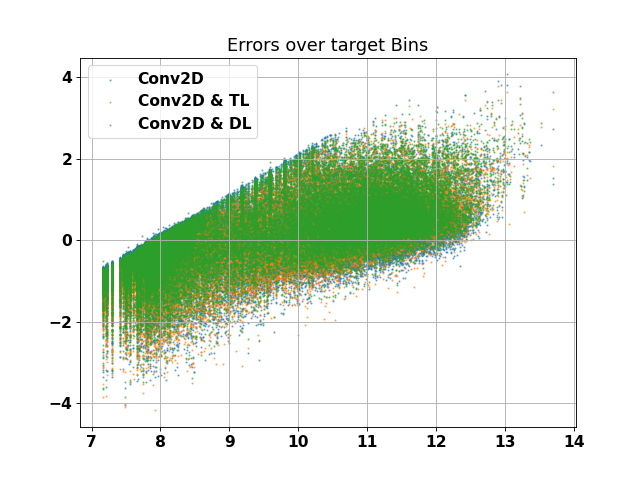

<IPython.core.display.Javascript object>


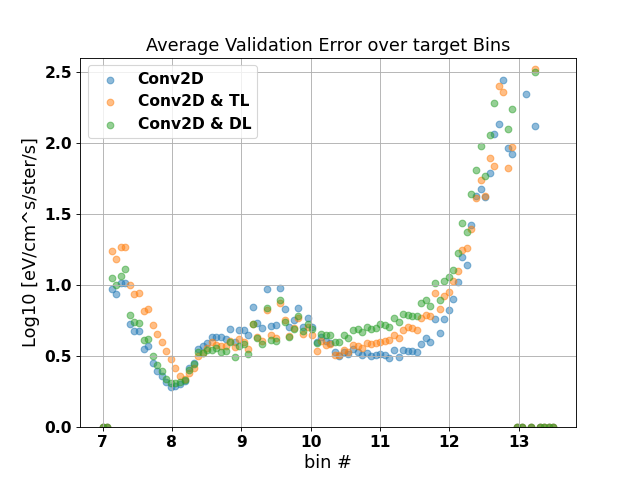

<IPython.core.display.Javascript object>


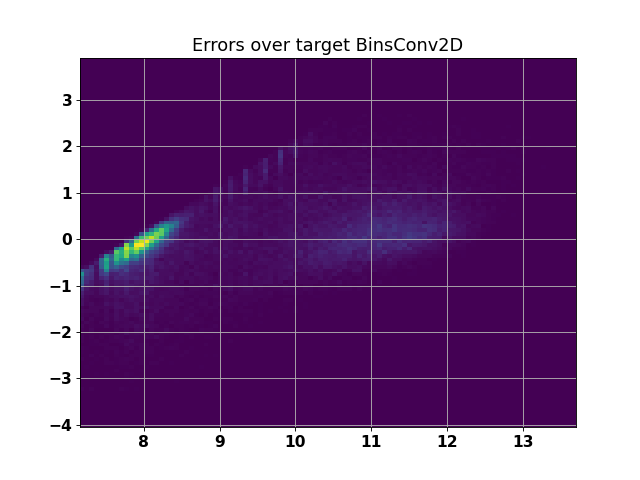

<IPython.core.display.Javascript object>


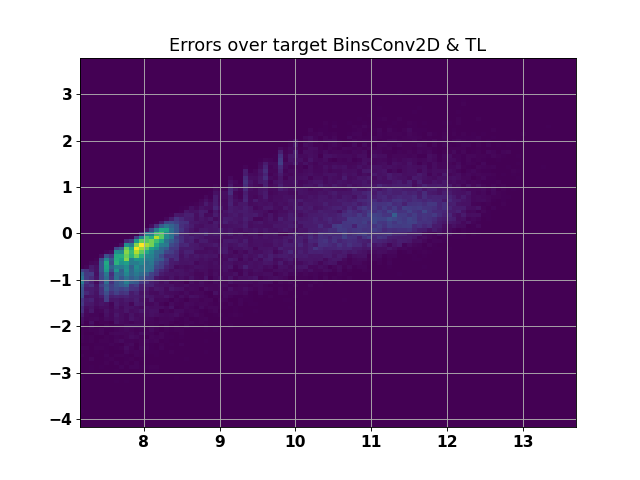

<IPython.core.display.Javascript object>


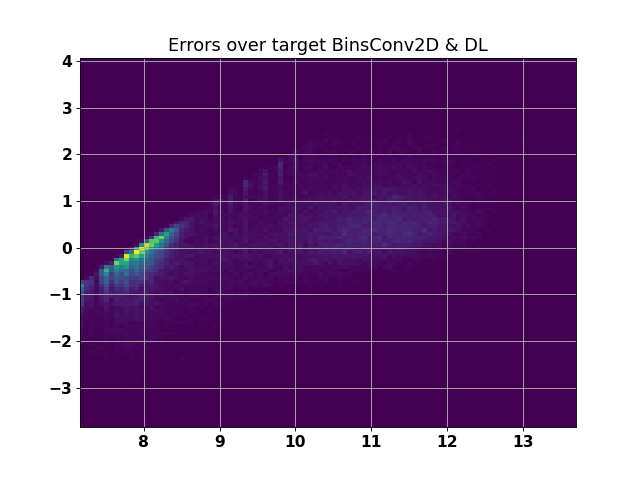

<IPython.core.display.Javascript object>


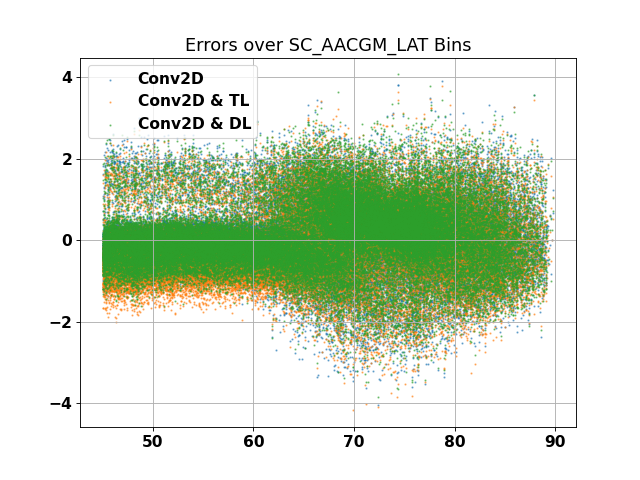

<IPython.core.display.Javascript object>


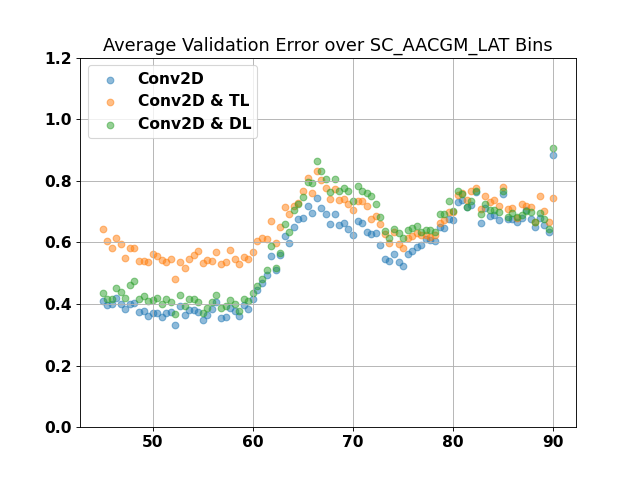

In [94]:
plot_model_multiple(All_results[3:6],model_names[3:6],y_val_log)


<IPython.core.display.Javascript object>


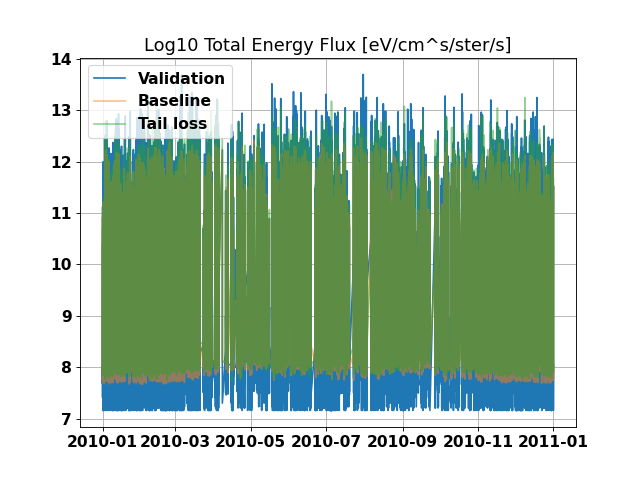

<IPython.core.display.Javascript object>


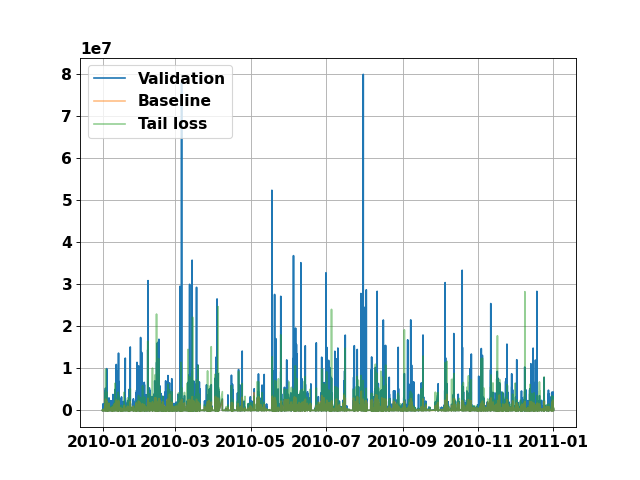

<IPython.core.display.Javascript object>


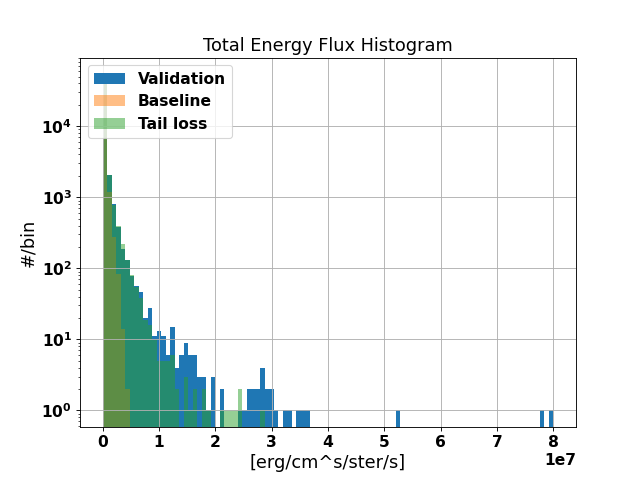

<IPython.core.display.Javascript object>


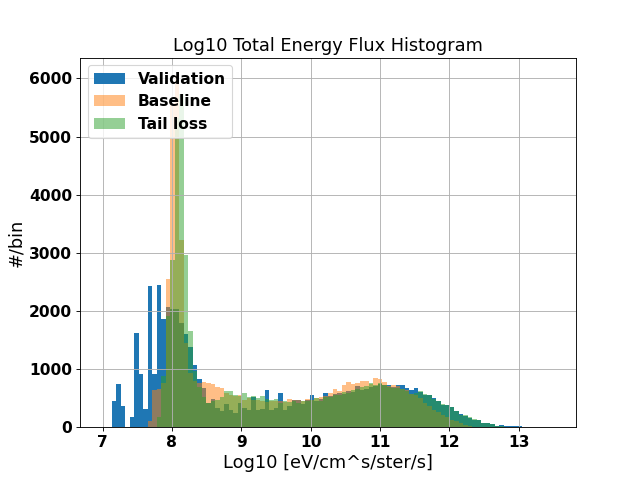

<IPython.core.display.Javascript object>


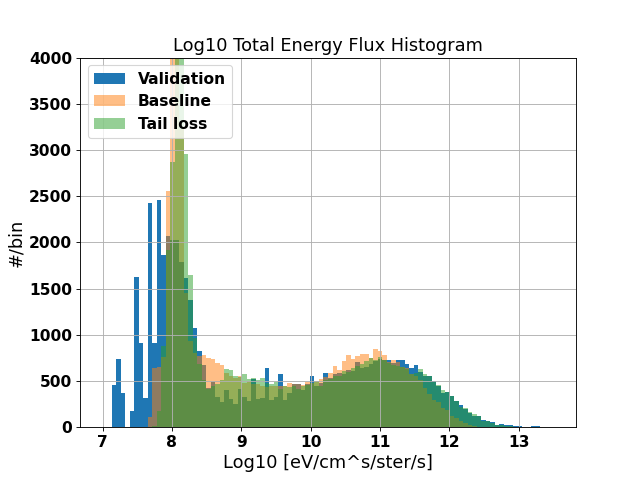

<IPython.core.display.Javascript object>


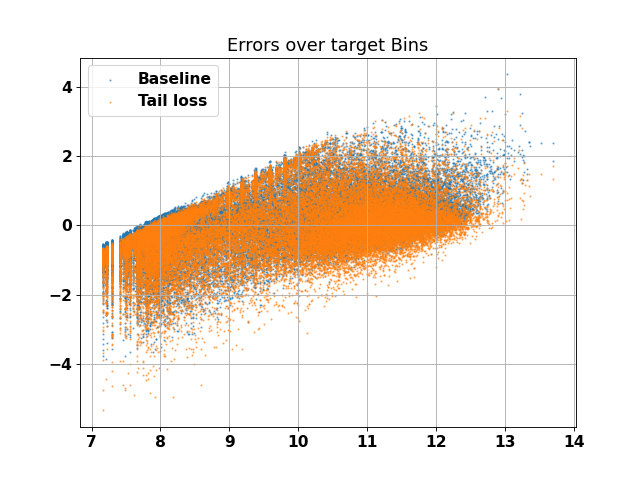

<IPython.core.display.Javascript object>


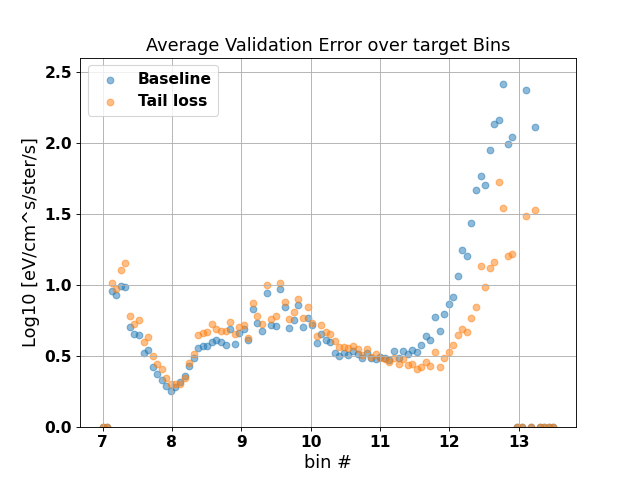

<IPython.core.display.Javascript object>


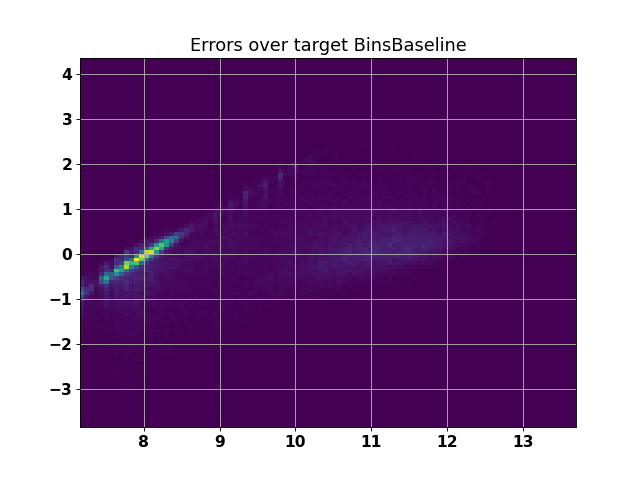

<IPython.core.display.Javascript object>


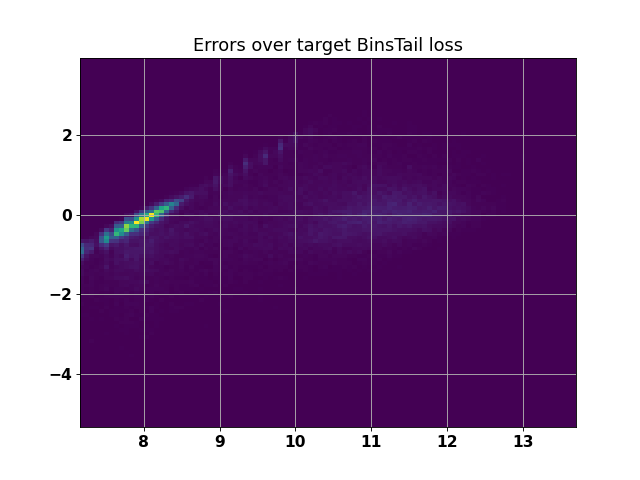

<IPython.core.display.Javascript object>


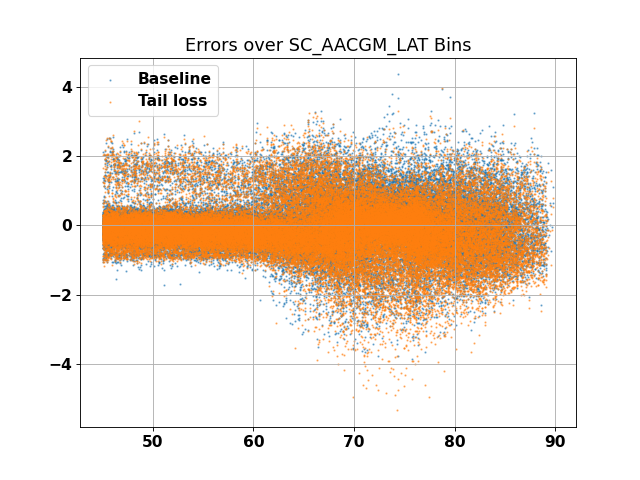

<IPython.core.display.Javascript object>


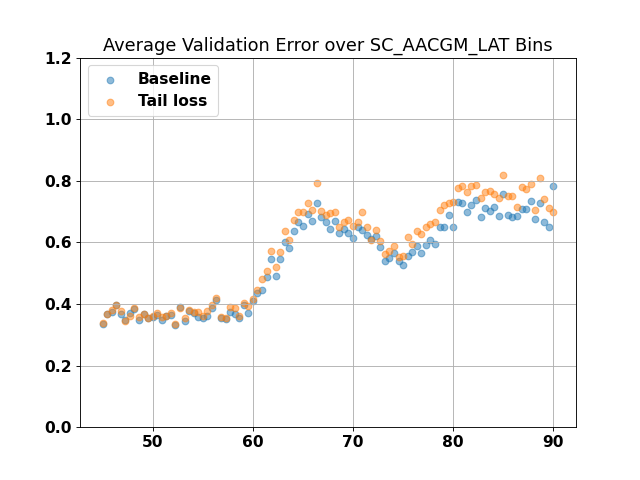

In [93]:
plot_model_multiple(All_results[0:2],model_names[0:2],y_val_log)


<IPython.core.display.Javascript object>


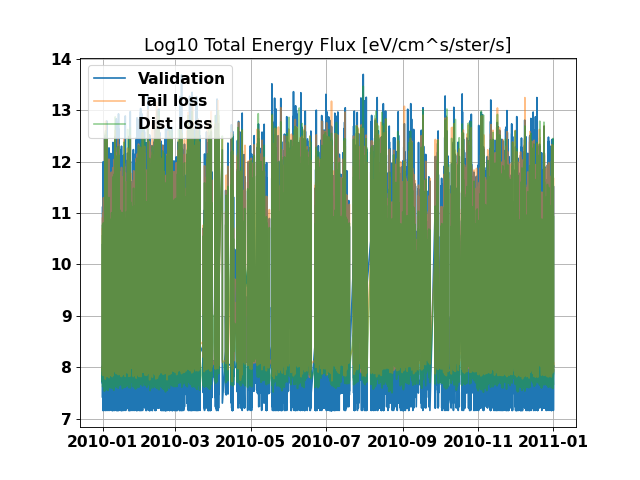

<IPython.core.display.Javascript object>


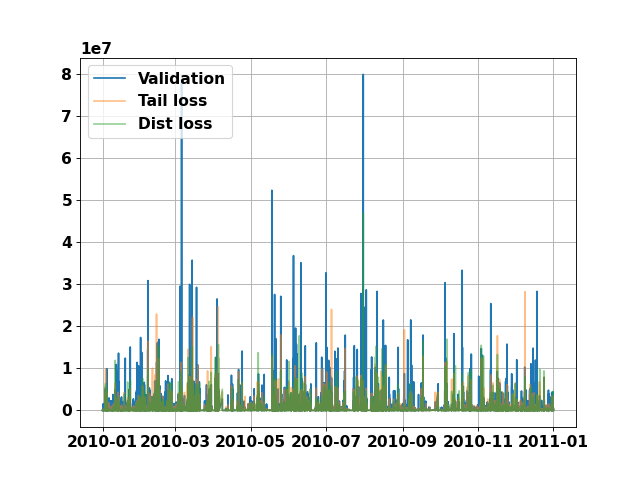

<IPython.core.display.Javascript object>


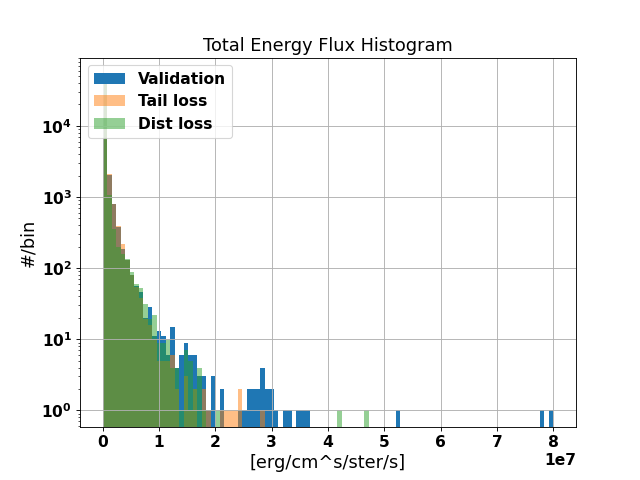

<IPython.core.display.Javascript object>


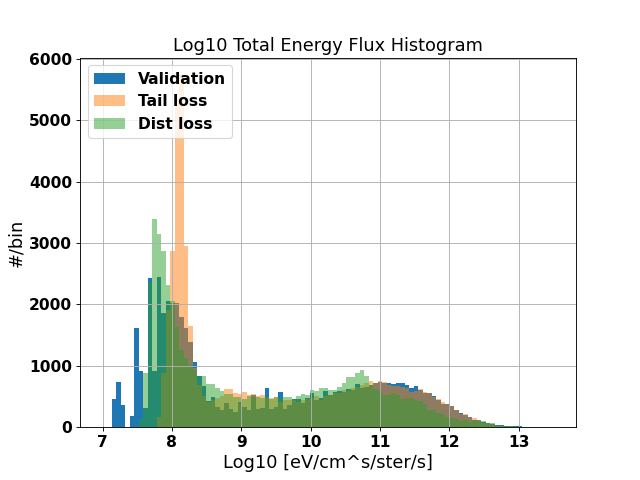

<IPython.core.display.Javascript object>


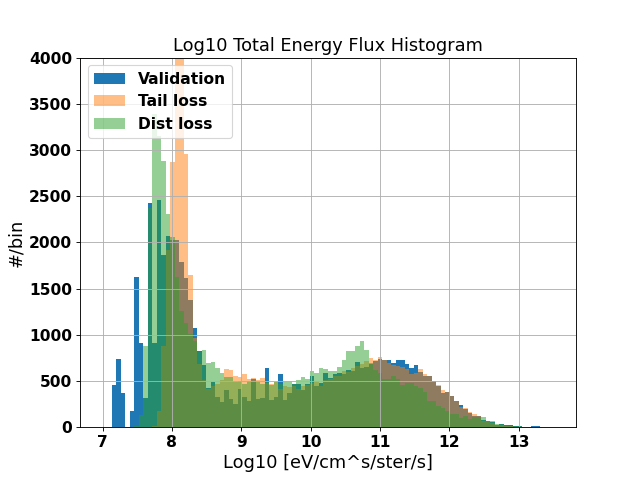

<IPython.core.display.Javascript object>


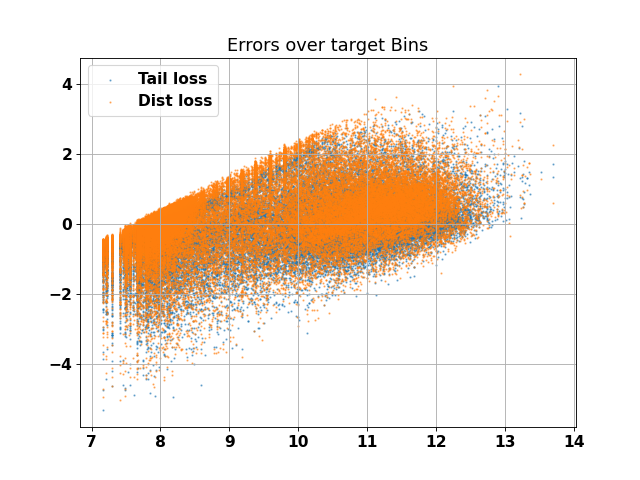

<IPython.core.display.Javascript object>


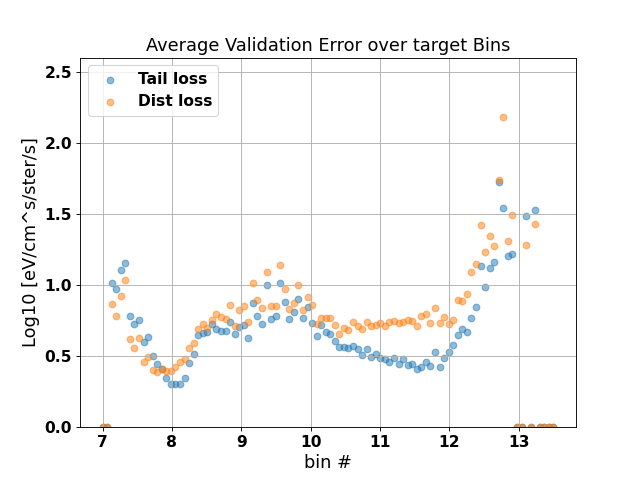

<IPython.core.display.Javascript object>


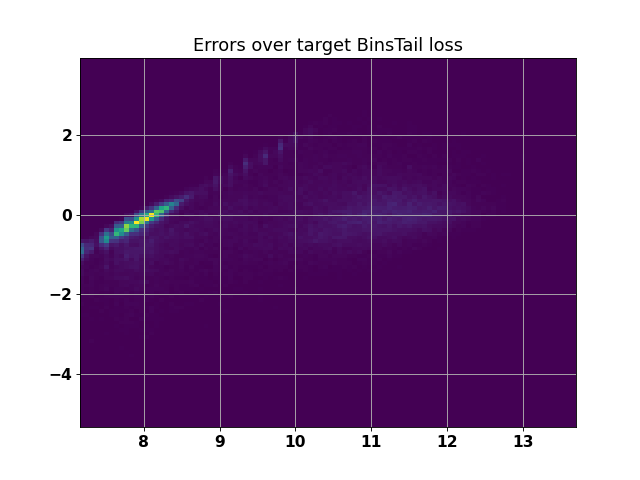

<IPython.core.display.Javascript object>


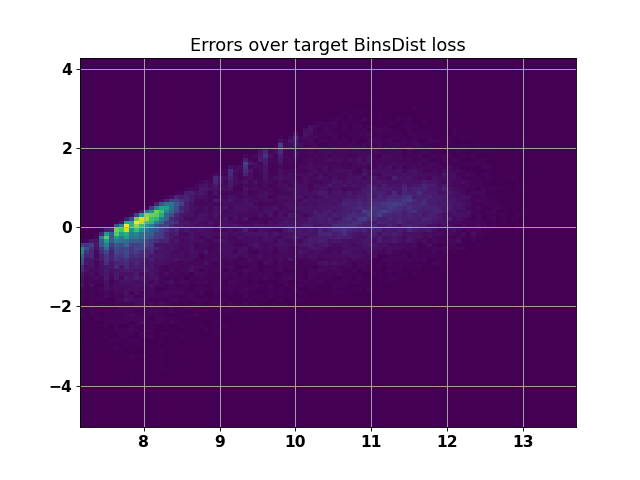

<IPython.core.display.Javascript object>


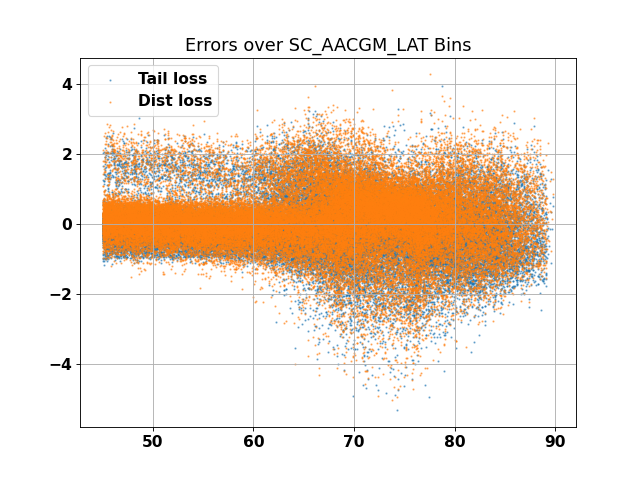

<IPython.core.display.Javascript object>


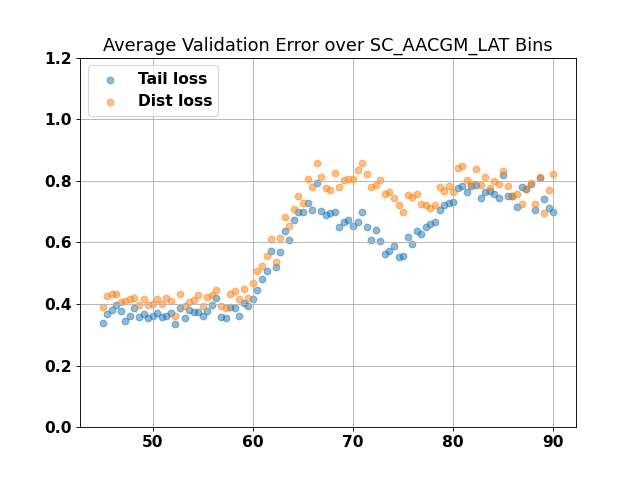

In [91]:
plot_model_multiple(All_results[1:3],model_names[1:3],y_val_log)


<IPython.core.display.Javascript object>


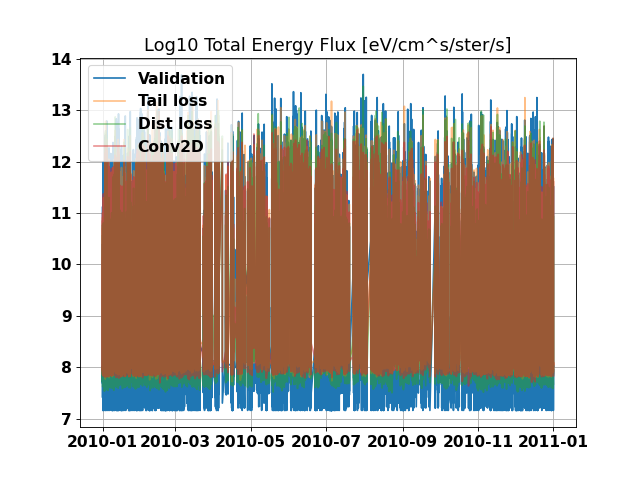

<IPython.core.display.Javascript object>


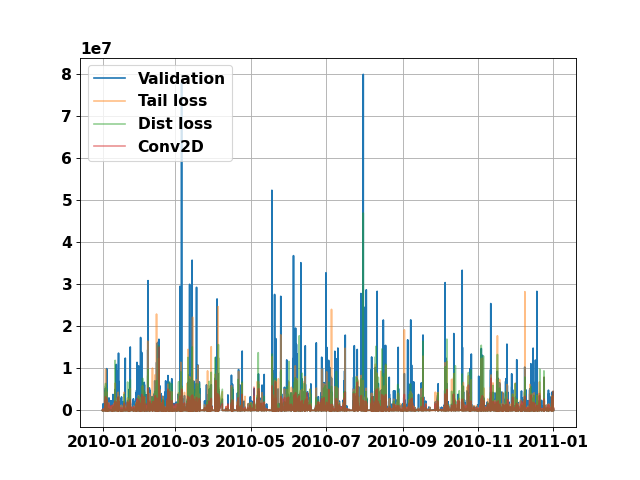

<IPython.core.display.Javascript object>


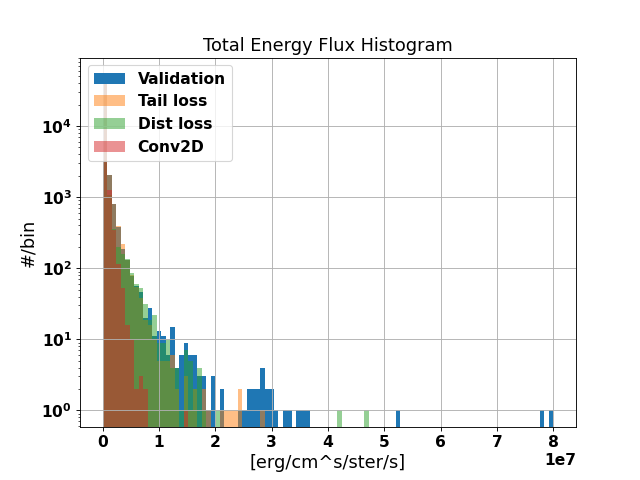

<IPython.core.display.Javascript object>


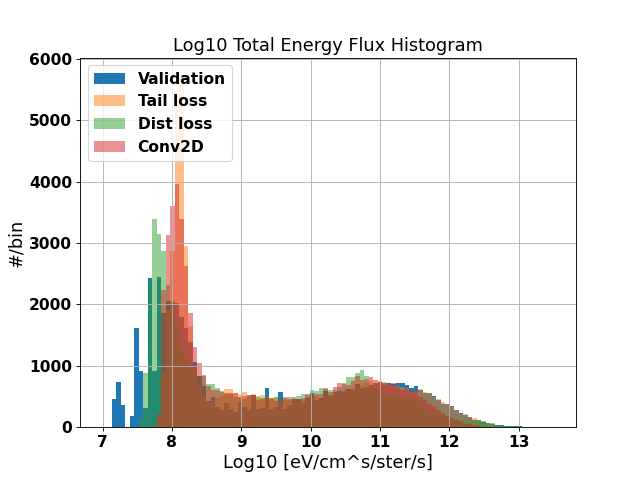

<IPython.core.display.Javascript object>


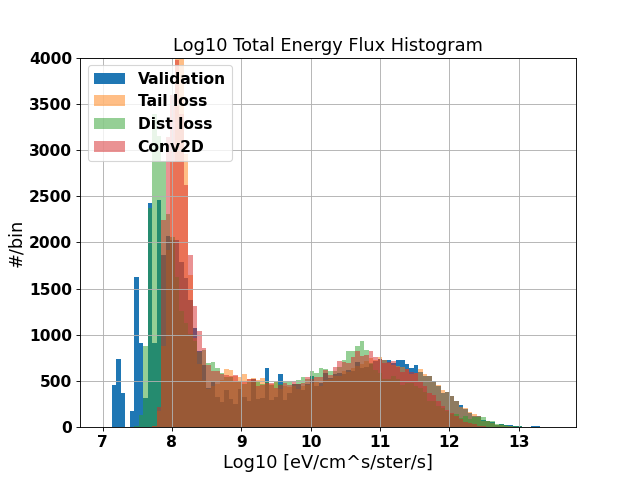

<IPython.core.display.Javascript object>


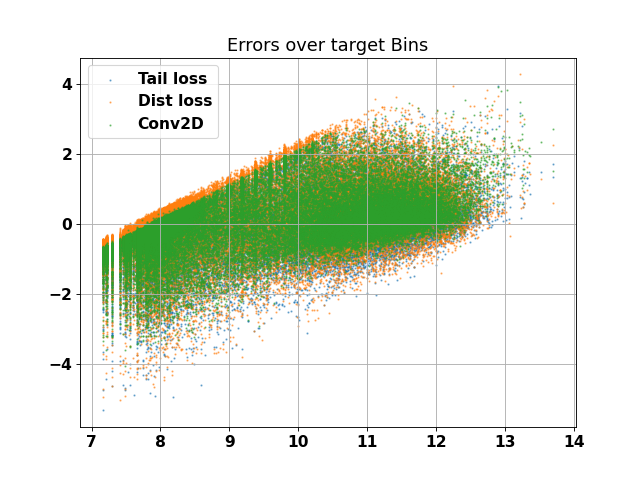

<IPython.core.display.Javascript object>


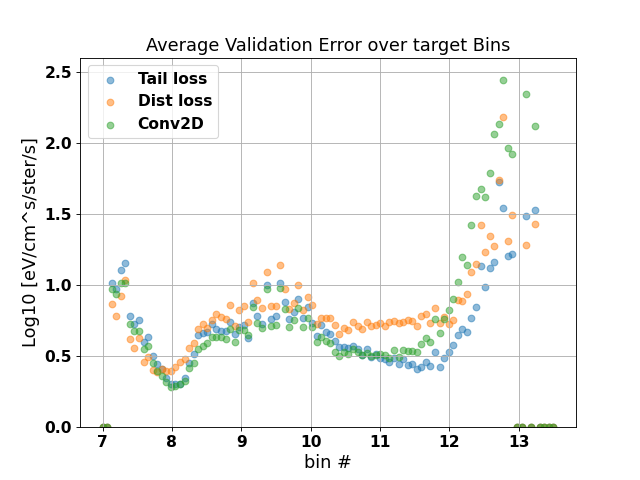

<IPython.core.display.Javascript object>


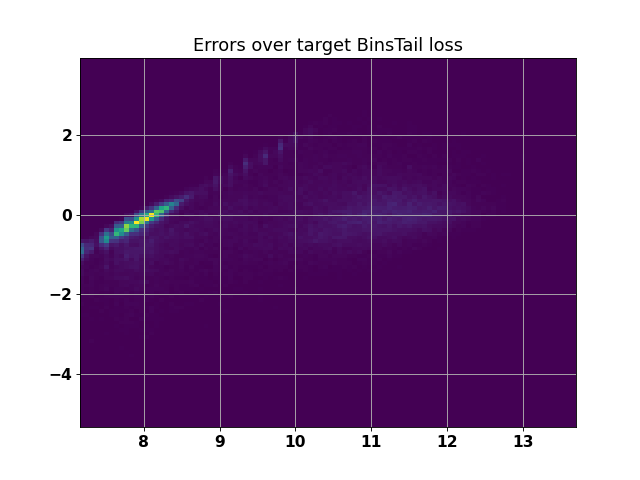

<IPython.core.display.Javascript object>


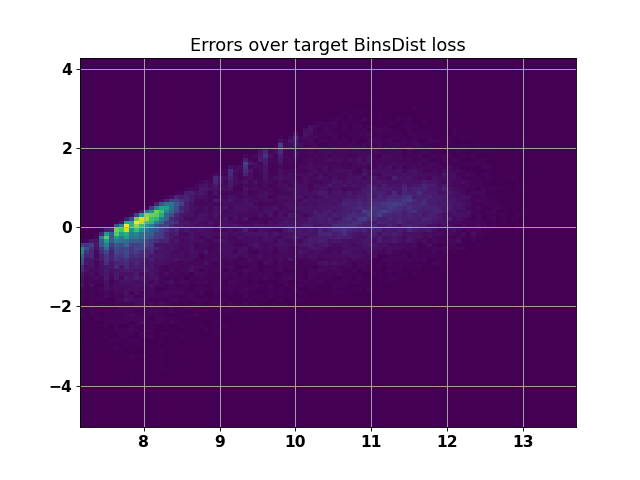

<IPython.core.display.Javascript object>


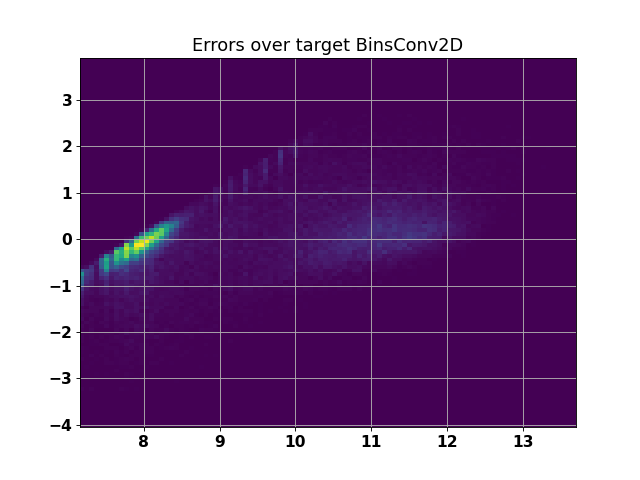

<IPython.core.display.Javascript object>


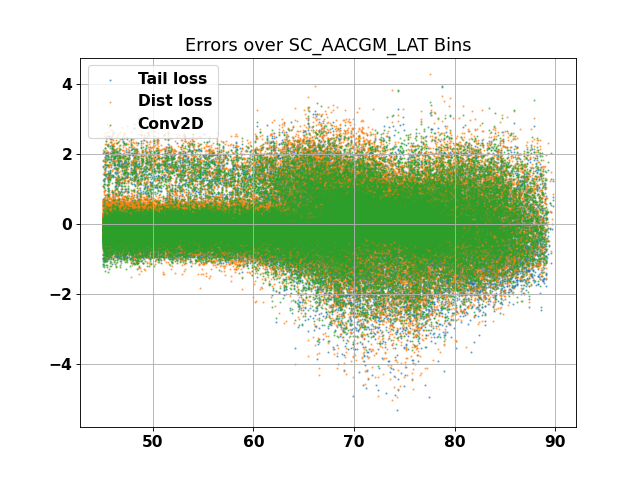

<IPython.core.display.Javascript object>


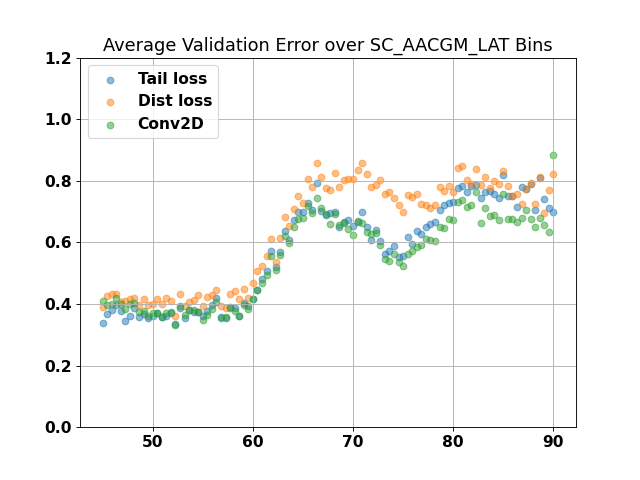

In [92]:
plot_model_multiple(All_results[1:4],model_names[1:4],y_val_log)

<IPython.core.display.Javascript object>


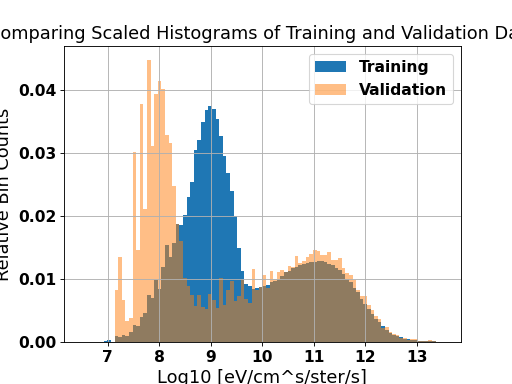

In [81]:
plt.figure()
plt.hist(np.log10(3.14*10**y_train_log),bins=100,weights=1/y_train_log.shape[0]*np.ones(y_train_log.shape[0]), range=(6.5,13.5))
plt.hist(np.log10(3.14*10**y_val_log),bins=100, alpha=0.5,weights=1/y_val_log.shape[0]*np.ones(y_val_log.shape[0]), range=(6.5,13.5))
plt.legend(['Training','Validation'])
plt.title('Comparing Scaled Histograms of Training and Validation Data')
plt.ylabel('Relative Bin Counts')
plt.xlabel('Log10 [eV/cm^s/ster/s]')
plt.grid()
plt.show()